In [268]:
#initial imports numpy,pandas, matplot
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()  # for plot styling
import numpy as np
import pandas as pd

In [269]:
#Start examining the dog.jpeg image
original_dog_img = plt.imread('dog.jpeg')

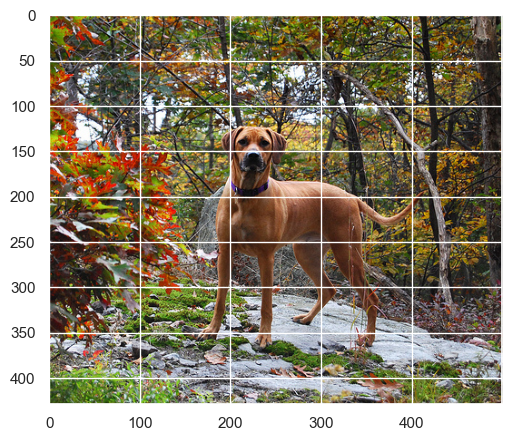

In [270]:
#visualize the dog image to see pixel values
plt.imshow(original_dog_img)

In [271]:
#dog image is an 429x500 pixel image 
original_dog_img.shape 

(429, 500, 3)

In [272]:
#Using OpenCV library to processing image /resizing etc.
import cv2

In [273]:
#load dog image & convert tto bgr format to rgb format
dog_image = cv2.imread('dog.jpeg')
dog_image = cv2.cvtColor(dog_image, cv2.COLOR_BGR2RGB)

In [274]:
dog_image.nbytes

643500

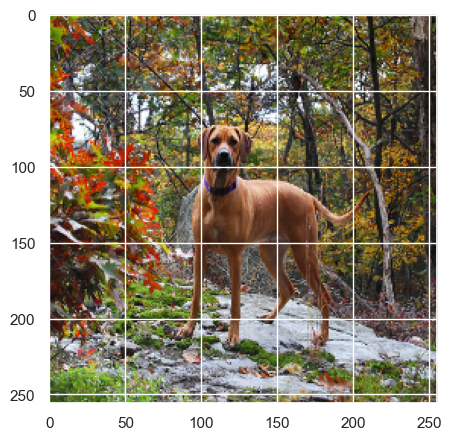

In [275]:
#Resize image to 256x256x3 
resized_dog_image = cv2.resize(dog_image,(256,256))
plt.imshow(resized_dog_image)

In [276]:
#shape of array
resized_dog_image.shape

(256, 256, 3)

In [277]:
#this is 3d array
resized_dog_image

array([[[ 95,  41,  14],
        [102,  67,  57],
        [103,  81,  40],
        ...,
        [ 53,  56,  50],
        [ 71,  85,  69],
        [ 57,  80,  66]],

       [[135,  95,  34],
        [101,  90,  29],
        [ 70, 107,  12],
        ...,
        [ 29,  24,  25],
        [ 64,  80,  59],
        [ 66,  98,  39]],

       [[110, 131,  25],
        [ 79, 122,   9],
        [ 79, 120,   5],
        ...,
        [ 35,  32,  29],
        [ 74,  79,  65],
        [ 83, 114,  15]],

       ...,

       [[ 59,  87,  23],
        [ 56,  71,  28],
        [ 52,  75,  34],
        ...,
        [117, 104,  80],
        [133, 104,  68],
        [ 88,  73,  55]],

       [[ 60,  95,  20],
        [ 50,  74,  18],
        [ 63,  96,  24],
        ...,
        [136, 108, 104],
        [104,  71,  67],
        [ 68,  45,  43]],

       [[ 54,  74,  17],
        [ 58,  67,  31],
        [ 71,  92,  28],
        ...,
        [ 52,  30,  17],
        [117,  83,  59],
        [141,  98,  74]]

In [278]:
#reshape to 2d array
dog_array_2d = resized_dog_image.reshape(-1, 3)
dog_array_2d # [RED_channel_value, GREEN_channel_value, BLUE_channel_value]

array([[ 95,  41,  14],
       [102,  67,  57],
       [103,  81,  40],
       ...,
       [ 52,  30,  17],
       [117,  83,  59],
       [141,  98,  74]], dtype=uint8)

In [279]:
#shape of 2d array (256x256=65536 rows, 3(RGB channels) columns)
dog_array_2d.shape

(65536, 3)

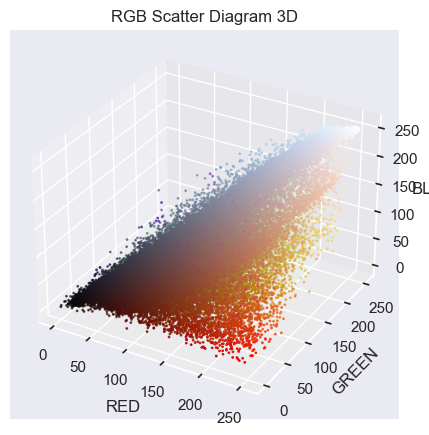

In [280]:
# Ploting scatter diagram of 3-dimensional RGB representation of image to see R,G,B channels together
R = dog_array_2d[:,0]
G = dog_array_2d[:,1]
B = dog_array_2d[:,2]

fig= plt.figure()
ax= fig.add_subplot(111, projection='3d')
ax.scatter(R,G,B, c= dog_array_2d/255.0 , s=1)

ax.set_xlabel("RED")
ax.set_ylabel("GREEN")
ax.set_zlabel("BLUE")
plt.title("RGB Scatter Diagram 3D")
plt.show()

In [281]:
#how many bytes dog image consist of
dog_array_2d.nbytes

196608

In [282]:
#finding unique colors in dog image
rgb_tuples = list(zip(R,G,B))
unique_colors = set(rgb_tuples)
len(unique_colors)

60192

In [283]:
#K-means model initialization
from sklearn.cluster import KMeans

In [284]:
#Lets try on k=2 first 
kmeans =KMeans(n_clusters=2,init='random',n_init=10, max_iter=400, random_state=0)
kmeans.fit(dog_array_2d)

KMeans(init='random', max_iter=400, n_clusters=2, n_init=10, random_state=0)

In [285]:
#Reassigning cluster labels
labels = kmeans.labels_
centers =kmeans.cluster_centers_
compressed_img = centers[labels].reshape(resized_dog_image.shape)

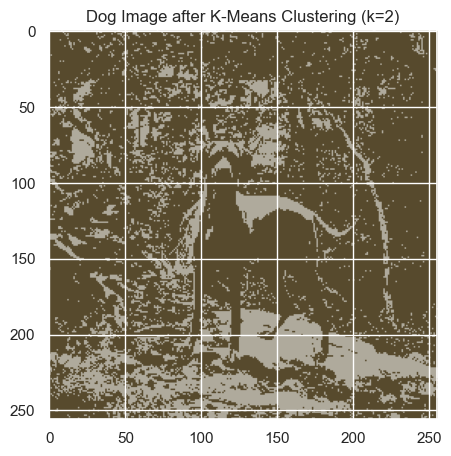

K=2 clustered image bytes:  1572864


True

In [286]:
#visualzing k=2 clustered compressed image
plt.imshow(compressed_img.astype(np.uint8))
plt.title(f"Dog Image after K-Means Clustering (k=2)")
plt.show()
print(f"K=2 clustered image bytes: ", compressed_img.nbytes)
cv2.imwrite(f'clustered_dog_image_k2.jpeg',cv2.cvtColor(compressed_img.astype(np.uint8), cv2.COLOR_RGB2BGR))

In [287]:
#color name finding with webcolors
import webcolors
def find_color_name(rgb):
    try:
        rgb_toint = tuple(int(val)for val in rgb)
        print(rgb_toint)
        color_hex = webcolors.rgb_to_hex(rgb_toint)
        color_name =  webcolors.hex_to_name(color_hex)
        return color_hex,color_name
    except ValueError:
        return color_hex,"No assigned color name"

print("Centroid colors for k=2 clusters")
for centroid in centers:
    color_hex,name = find_color_name(centroid)
    print("Centroid color in hex:", color_hex,name)
    

Centroid colors for k=2 clusters
(87, 74, 45)
Centroid color in hex: #574a2d No assigned color name
(175, 170, 156)
Centroid color in hex: #afaa9c No assigned color name


In [288]:
#There are no color names for k=2 clusters' centroids
##Implementation of  WCSS
def wcss(image_data, centers, labels):
    wcss = 0
    for i in range(len(image_data)):
        index= labels[i]
        dist =np.linalg.norm(image_data[i] - centers[index])
        wcss+=dist**2
    return wcss

dog_wcss_scores = []
wcss(dog_array_2d,centers,labels)

239505153.39660832

In [289]:
dog_wcss_scores.append(wcss(dog_array_2d,centers,labels))

In [290]:
#Implementation of BCSS
def bcss(img_data, centers, labels):
    sample_mean = np.mean(img_data,axis=0)
    bcss = 0
    distinct_labels =np.unique(labels)
    count_of_labels = np.array([np.sum(labels==label) for label in distinct_labels])
    
    for i,label in enumerate(distinct_labels):
        points_in_cluster = img_data[labels==label]
        center = centers[i]
        count_of_label = count_of_labels[i]
        overall_distances=0
        for p in points_in_cluster:
            overall_distances += np.linalg.norm(p - center)**2
        d = np.linalg.norm(center - sample_mean)
        bcss+= d**2*count_of_label
    return bcss
    
dog_bcss_scores = []
bcss(dog_array_2d,centers,labels)

360140281.7968954

In [291]:
dog_bcss_scores.append(bcss(dog_array_2d,centers,labels))

In [292]:
#Implementation of Silhouette
from sklearn.metrics import pairwise_distances
def silhouette(img_data,centers, labels):
    #I will iterate for only 1000 random data point since 65536 points are too expensive computationally my memory could not handle this.
    num_points= 1000
    selected_points = np.random.choice(img_data.shape[0],size=num_points,replace=True)
    #calculate intra a(i)
    #calculate outer b(i)
    #return (b(i)-a(i))/max{a(i),b(i)}
    selected_data = img_data[selected_points]
    selected_labels = labels[selected_points]
    distinct_labels = np.unique(selected_labels)
    silhouette_scores = []
    ci =np.bincount(selected_labels)
    distances = pairwise_distances(selected_data)
    for i in range(num_points):
            label =selected_labels[i]
            dist = distances[i][selected_labels == label]
            ai = np.mean(dist)
            bi = min([np.mean(distances[i][selected_labels == l])for l in distinct_labels if l !=label])
            silhouette = (bi-ai)/max(ai,bi)
            silhouette_scores.append(silhouette)
    return np.mean(silhouette_scores)
silhouettes_dog=[]
s=silhouette(dog_array_2d,centers,labels)
s


0.5432196879440753

In [293]:
silhouettes_dog.append(s)
from sklearn.metrics import silhouette_score
silhouette_score(dog_array_2d,labels)

0.5504120010900112

In [294]:
#values are close enough, iterating for whole data set is not possible for my setup so I will continue with this
# now lets repeat those steps for k=4,8,16,32,64,128,256
k_values = np.array([4,8,16,32,64,128,256])
compressed_dog_images = []
for k in k_values:
    kmeans = KMeans(n_clusters=k,init='random',n_init=10, max_iter=400, random_state=0)
    kmeans.fit(dog_array_2d)
    labels = kmeans.labels_
    centers = kmeans.cluster_centers_
    compressed_img = centers[labels].reshape(resized_dog_image.shape)
    compressed_dog_images.append(compressed_img)
    
    #find centroid colors
    print(f"Centroid colors for k={k} clusters")
    for centroid in centers:
        print("Centroid color:",find_color_name(centroid))
    
    #calculate wcss,bcss,silhouette
    dog_wcss_scores.append(wcss(dog_array_2d,centers,labels))
    dog_bcss_scores.append(bcss(dog_array_2d,centers,labels))
    silhouettes_dog.append(silhouette(dog_array_2d,centers,labels))    


Centroid colors for k=4 clusters
(111, 92, 50)
Centroid color: ('#6f5c32', 'No assigned color name')
(148, 137, 106)
Centroid color: ('#94896a', 'No assigned color name')
(57, 48, 34)
Centroid color: ('#393022', 'No assigned color name')
(196, 198, 201)
Centroid color: ('#c4c6c9', 'No assigned color name')
Centroid colors for k=8 clusters
(204, 207, 213)
Centroid color: ('#cccfd5', 'No assigned color name')
(169, 71, 16)
Centroid color: ('#a94710', 'No assigned color name')
(162, 158, 153)
Centroid color: ('#a29e99', 'No assigned color name')
(112, 104, 40)
Centroid color: ('#706828', 'No assigned color name')
(44, 37, 28)
Centroid color: ('#2c251c', 'No assigned color name')
(165, 146, 69)
Centroid color: ('#a59245', 'No assigned color name')
(79, 66, 44)
Centroid color: ('#4f422c', 'No assigned color name')
(112, 107, 97)
Centroid color: ('#706b61', 'No assigned color name')
Centroid colors for k=16 clusters
(128, 126, 120)
Centroid color: ('#807e78', 'No assigned color name')
(181, 

Centroid colors for k=128 clusters
(227, 233, 240)
Centroid color: ('#e3e9f0', 'No assigned color name')
(97, 33, 11)
Centroid color: ('#61210b', 'No assigned color name')
(187, 193, 29)
Centroid color: ('#bbc11d', 'No assigned color name')
(30, 27, 25)
Centroid color: ('#1e1b19', 'No assigned color name')
(159, 161, 162)
Centroid color: ('#9fa1a2', 'No assigned color name')
(85, 59, 45)
Centroid color: ('#553b2d', 'No assigned color name')
(35, 47, 17)
Centroid color: ('#232f11', 'No assigned color name')
(143, 136, 126)
Centroid color: ('#8f887e', 'No assigned color name')
(213, 221, 231)
Centroid color: ('#d5dde7', 'No assigned color name')
(140, 91, 62)
Centroid color: ('#8c5b3e', 'No assigned color name')
(122, 103, 13)
Centroid color: ('#7a670d', 'No assigned color name')
(15, 13, 14)
Centroid color: ('#0f0d0e', 'No assigned color name')
(154, 152, 19)
Centroid color: ('#9a9813', 'No assigned color name')
(189, 135, 100)
Centroid color: ('#bd8764', 'No assigned color name')
(203,

Centroid colors for k=256 clusters
(225, 237, 246)
Centroid color: ('#e1edf6', 'No assigned color name')
(219, 86, 62)
Centroid color: ('#db563e', 'No assigned color name')
(201, 180, 102)
Centroid color: ('#c9b466', 'No assigned color name')
(31, 44, 16)
Centroid color: ('#1f2c10', 'No assigned color name')
(146, 134, 70)
Centroid color: ('#928646', 'No assigned color name')
(221, 39, 8)
Centroid color: ('#dd2708', 'No assigned color name')
(161, 153, 130)
Centroid color: ('#a19982', 'No assigned color name')
(196, 200, 36)
Centroid color: ('#c4c824', 'No assigned color name')
(105, 104, 111)
Centroid color: ('#69686f', 'No assigned color name')
(98, 112, 60)
Centroid color: ('#62703c', 'No assigned color name')
(36, 27, 24)
Centroid color: ('#241b18', 'No assigned color name')
(97, 92, 90)
Centroid color: ('#615c5a', 'No assigned color name')
(218, 219, 222)
Centroid color: ('#dadbde', 'No assigned color name')
(51, 22, 15)
Centroid color: ('#33160f', 'No assigned color name')
(131, 

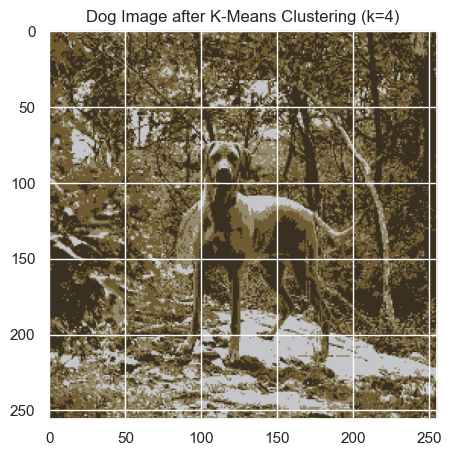

K=4 clustered image bytes:  1572864


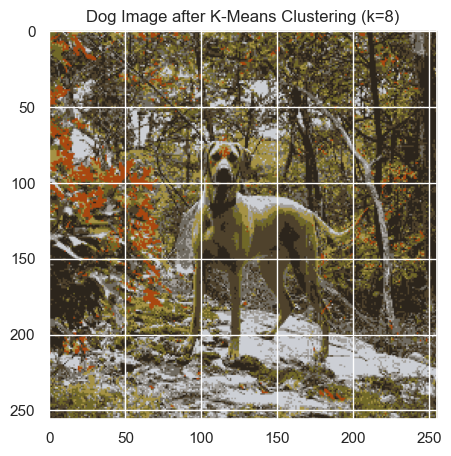

K=8 clustered image bytes:  1572864


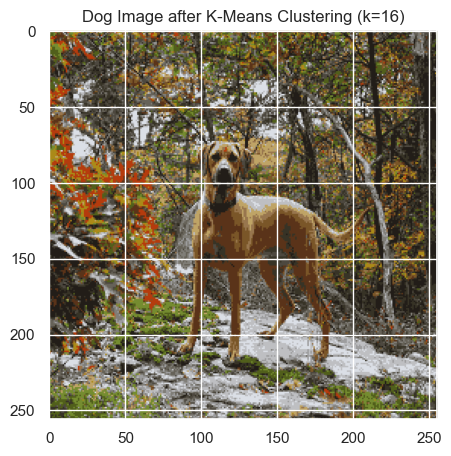

K=16 clustered image bytes:  1572864


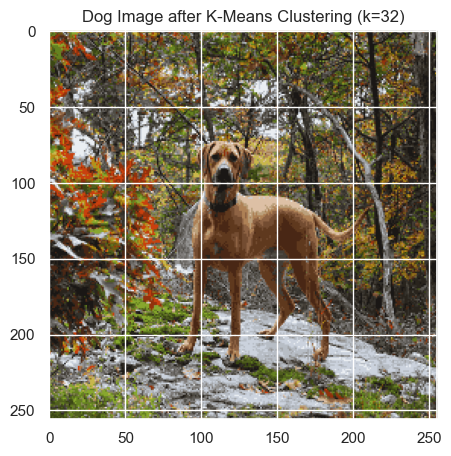

K=32 clustered image bytes:  1572864


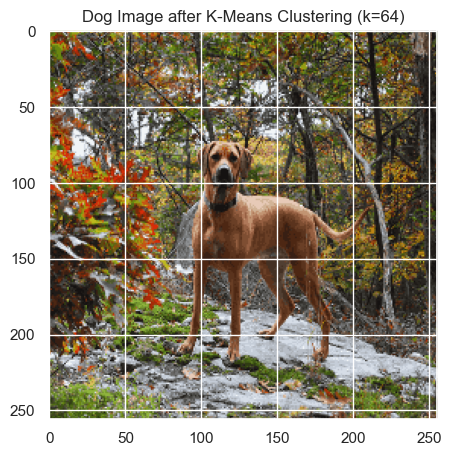

K=64 clustered image bytes:  1572864


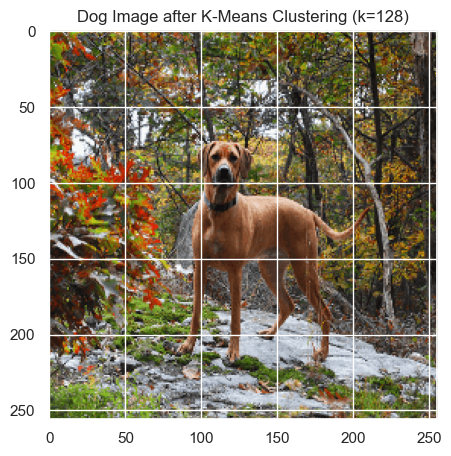

K=128 clustered image bytes:  1572864


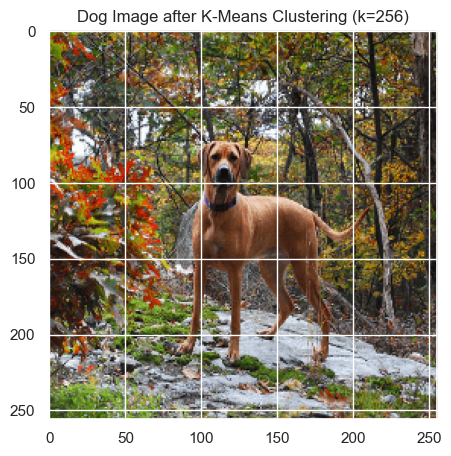

K=256 clustered image bytes:  1572864


In [295]:
#Visualize each clustered images for dog.jpeg, print byte numbers, save them as new jpeg
for i,image in enumerate(compressed_dog_images):
    plt.imshow(image.astype(np.uint8))
    plt.title(f"Dog Image after K-Means Clustering (k={k_values[i]})")
    plt.show()
    
    print(f"K={k_values[i]} clustered image bytes: ", image.nbytes)
    cv2.imwrite(f'clustered_dog_image_k{k}.jpeg',cv2.cvtColor(image.astype(np.uint8),cv2.COLOR_RGB2BGR))

In [296]:
dog_wcss_scores

[239505153.39660832,
 114525672.88260053,
 64449997.602277234,
 36172274.84858297,
 21050273.416945446,
 12874556.95493478,
 8153433.2917759055,
 5255373.611955973]

In [297]:
dog_bcss_scores

[360140281.7968954,
 485471734.42063034,
 535150420.9521267,
 562651216.634579,
 577923335.6498157,
 586205696.4499395,
 591047747.0949818,
 593913944.8634928]

In [298]:
silhouettes_dog

[0.5432196879440753,
 0.37714193017917513,
 0.3426893976347593,
 0.31980072088440653,
 0.3041614374260026,
 0.30665765108156834,
 0.3122945652871016,
 0.3676844884502618]

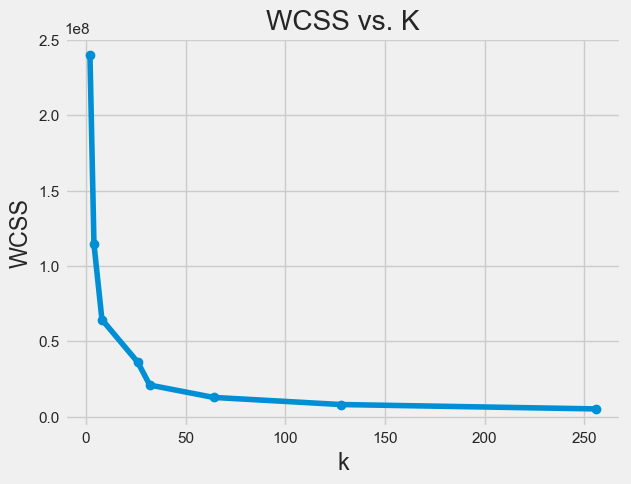

In [299]:
##plot wcss scores 
ks = np.array([2,4,8,26,32,64,128,256])
plt.style.use("fivethirtyeight")
plt.plot(ks, dog_wcss_scores, marker='o')  
plt.xlabel("k")
plt.ylabel("WCSS")
plt.title("WCSS vs. K")
plt.show()

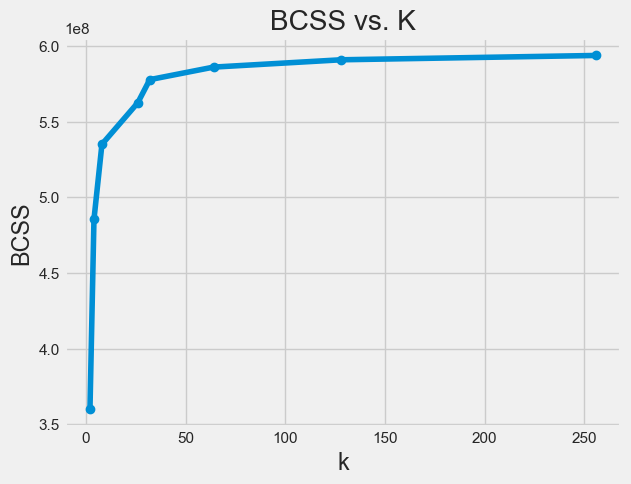

In [300]:
#plot bcss scores
plt.style.use("fivethirtyeight")
plt.plot(ks, dog_bcss_scores, marker='o')  
plt.xlabel("k")
plt.ylabel("BCSS")
plt.title("BCSS vs. K")
plt.show()

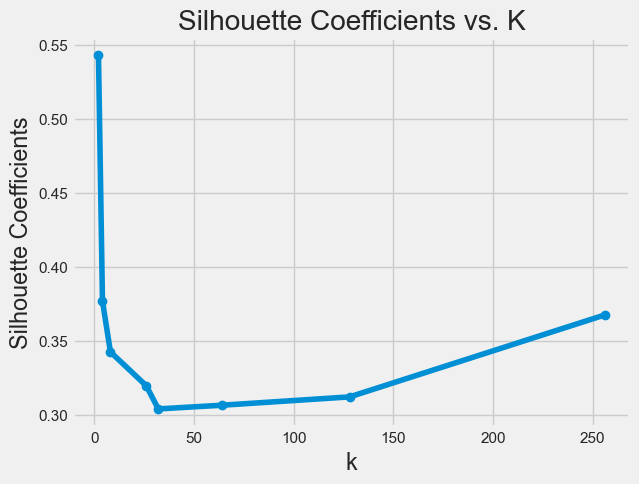

In [301]:
#silhouette coefficietns plotting
plt.style.use("fivethirtyeight")
plt.plot(ks, silhouettes_dog, marker='o')  
plt.xlabel("k")
plt.ylabel("Silhouette Coefficients")
plt.title("Silhouette Coefficients vs. K")
plt.show()

In [302]:
#elbow locator function 
def elbow(array):
    changes = []
    change_rates = []
    for i in range(len(array)-1):
        changes.append(array[i]-array[i+1])
    for i in range(len(changes)-1):
         change_rates.append(changes[i]-changes[i+1]/changes[i])
            
    elbowindex =change_rates.index(min(change_rates))
    return 2**elbowindex

elbow(dog_wcss_scores)

32

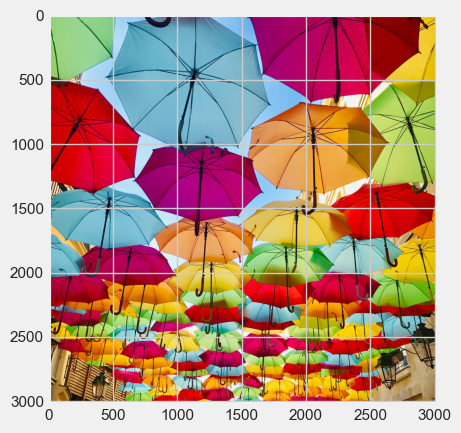

In [303]:
# Now the umbrealla image
original_umbrealla_img = plt.imread('umbrealla.jpeg')
plt.imshow(original_umbrealla_img)

In [304]:
original_umbrealla_img.shape 

(3024, 3024, 3)

In [305]:
#load umbrealla image & convert tto bgr format to rgb format
umbrella_image = cv2.imread('umbrealla.jpeg')
umbrella_image = cv2.cvtColor(umbrella_image, cv2.COLOR_BGR2RGB)

In [306]:
umbrella_image.nbytes

27433728

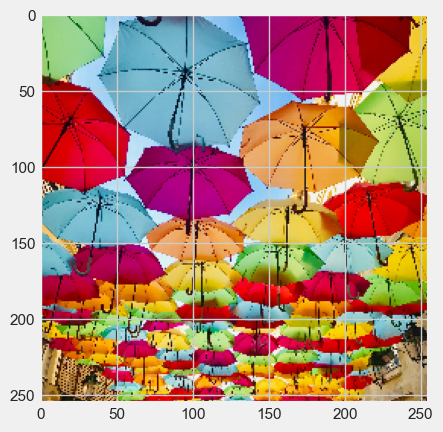

In [307]:
#Resize image to 256x256x3 
resized_umbrella_image = cv2.resize(umbrella_image,(256,256))
plt.imshow(resized_umbrella_image)

In [308]:
resized_umbrella_image.shape

(256, 256, 3)

In [309]:
#reshape to 2d array
umbrella_2d = resized_umbrella_image.reshape(-1, 3)
umbrella_2d # [RED_channel_value, GREEN_channel_value, BLUE_channel_value]

array([[146, 210, 125],
       [149, 209, 123],
       [150, 209, 123],
       ...,
       [ 16,   6,   1],
       [ 87,  66,  45],
       [ 34,  20,   3]], dtype=uint8)

In [310]:
# repeat everything for umbrella image
k_values = np.array([2,4,8,16,32,64,128,256])
compressed_umbrella_images = []
um_wcss_scores = []
um_bcss_scores = []
um_silhouette_scores= []
for k in k_values:
    kmeans = KMeans(n_clusters=k,init='random',n_init=10, max_iter=400, random_state=0)
    kmeans.fit(umbrella_2d)
    labels = kmeans.labels_
    centers = kmeans.cluster_centers_
    compressed_img = centers[labels].reshape(resized_dog_image.shape)
    cv2.imwrite(f'clustered_umbrella_image_k{k}.jpeg',cv2.cvtColor(compressed_img.astype(np.uint8),cv2.COLOR_RGB2BGR))
    compressed_umbrella_images.append(compressed_img)
    
    #find centroid colors
    print(f"Centroid colors for k={k} clusters")
    for centroid in centers:
        print("Centroid color:",find_color_name(centroid))
    
    #calculate wcss,bcss,silhouette
    um_wcss_scores.append(wcss(umbrella_2d,centers,labels))
    um_bcss_scores.append(bcss(umbrella_2d,centers,labels))
    um_silhouette_scores.append(silhouette(umbrella_2d,centers,labels))  

Centroid colors for k=2 clusters
(169, 187, 136)
Centroid color: ('#a9bb88', 'No assigned color name')
(157, 26, 37)
Centroid color: ('#9d1a25', 'No assigned color name')
Centroid colors for k=4 clusters
(137, 192, 198)
Centroid color: ('#89c0c6', 'No assigned color name')
(206, 174, 59)
Centroid color: ('#ceae3b', 'No assigned color name')
(65, 44, 28)
Centroid color: ('#412c1c', 'No assigned color name')
(182, 5, 47)
Centroid color: ('#b6052f', 'No assigned color name')
Centroid colors for k=8 clusters
(112, 177, 196)
Centroid color: ('#70b1c4', 'No assigned color name')
(184, 219, 231)
Centroid color: ('#b8dbe7', 'No assigned color name')
(181, 1, 90)
Centroid color: ('#b5015a', 'No assigned color name')
(147, 119, 24)
Centroid color: ('#937718', 'No assigned color name')
(194, 195, 107)
Centroid color: ('#c2c36b', 'No assigned color name')
(182, 3, 9)
Centroid color: ('#b60309', 'No assigned color name')
(51, 32, 27)
Centroid color: ('#33201b', 'No assigned color name')
(231, 169, 

Centroid colors for k=128 clusters
(62, 9, 4)
Centroid color: ('#3e0904', 'No assigned color name')
(213, 173, 3)
Centroid color: ('#d5ad03', 'No assigned color name')
(181, 217, 215)
Centroid color: ('#b5d9d7', 'No assigned color name')
(105, 57, 8)
Centroid color: ('#693908', 'No assigned color name')
(195, 86, 3)
Centroid color: ('#c35603', 'No assigned color name')
(182, 0, 89)
Centroid color: ('#b60059', 'No assigned color name')
(148, 203, 242)
Centroid color: ('#94cbf2', 'No assigned color name')
(215, 188, 144)
Centroid color: ('#d7bc90', 'No assigned color name')
(232, 140, 2)
Centroid color: ('#e88c02', 'No assigned color name')
(157, 126, 83)
Centroid color: ('#9d7e53', 'No assigned color name')
(229, 0, 42)
Centroid color: ('#e5002a', 'No assigned color name')
(93, 167, 190)
Centroid color: ('#5da7be', 'No assigned color name')
(95, 143, 161)
Centroid color: ('#5f8fa1', 'No assigned color name')
(157, 2, 127)
Centroid color: ('#9d027f', 'No assigned color name')
(179, 222, 

Centroid colors for k=256 clusters
(252, 176, 2)
Centroid color: ('#fcb002', 'No assigned color name')
(175, 217, 245)
Centroid color: ('#afd9f5', 'No assigned color name')
(121, 191, 200)
Centroid color: ('#79bfc8', 'No assigned color name')
(87, 57, 7)
Centroid color: ('#573907', 'No assigned color name')
(13, 98, 127)
Centroid color: ('#0d627f', 'No assigned color name')
(232, 210, 114)
Centroid color: ('#e8d272', 'No assigned color name')
(72, 153, 177)
Centroid color: ('#4899b1', 'No assigned color name')
(246, 232, 192)
Centroid color: ('#f6e8c0', 'No assigned color name')
(154, 111, 41)
Centroid color: ('#9a6f29', 'No assigned color name')
(168, 58, 3)
Centroid color: ('#a83a03', 'No assigned color name')
(209, 167, 84)
Centroid color: ('#d1a754', 'No assigned color name')
(209, 0, 0)
Centroid color: ('#d10000', 'No assigned color name')
(65, 110, 13)
Centroid color: ('#416e0d', 'No assigned color name')
(167, 0, 113)
Centroid color: ('#a70071', 'No assigned color name')
(223, 1

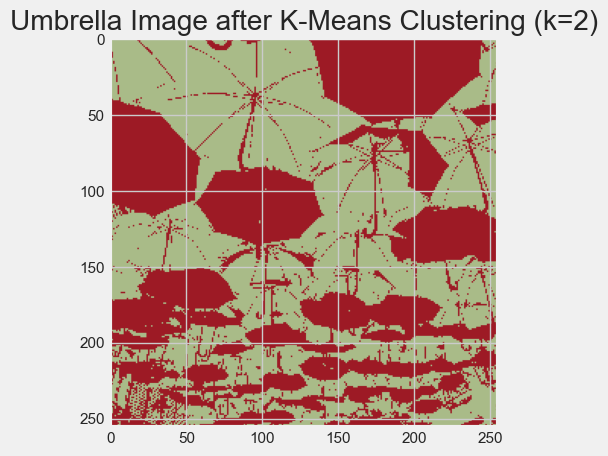

K=2 clustered image bytes:  1572864


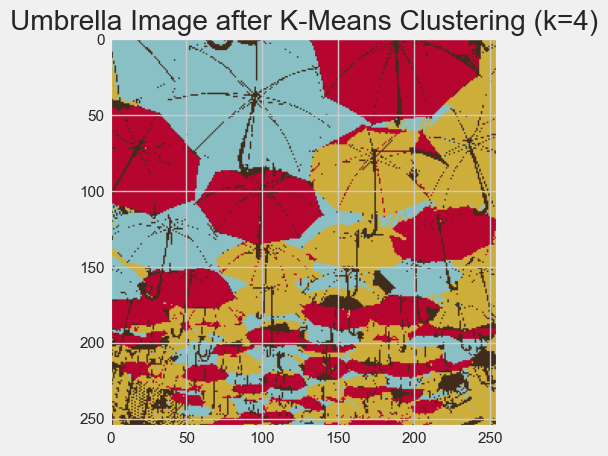

K=4 clustered image bytes:  1572864


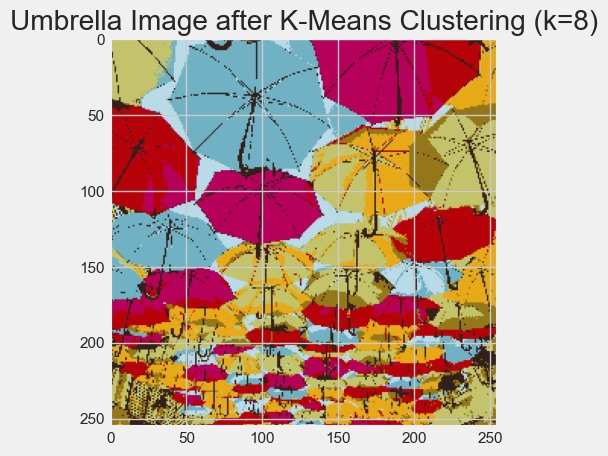

K=8 clustered image bytes:  1572864


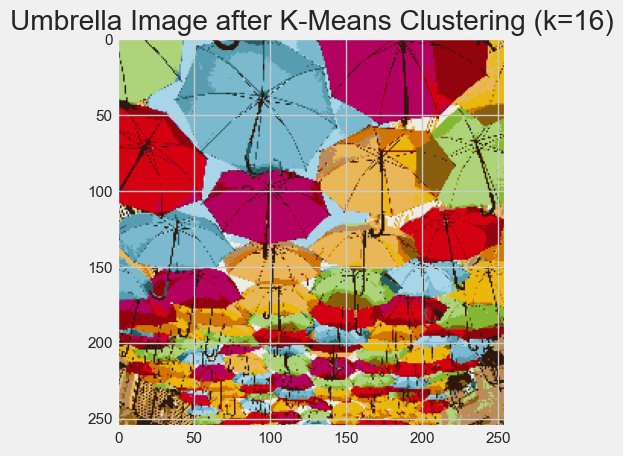

K=16 clustered image bytes:  1572864


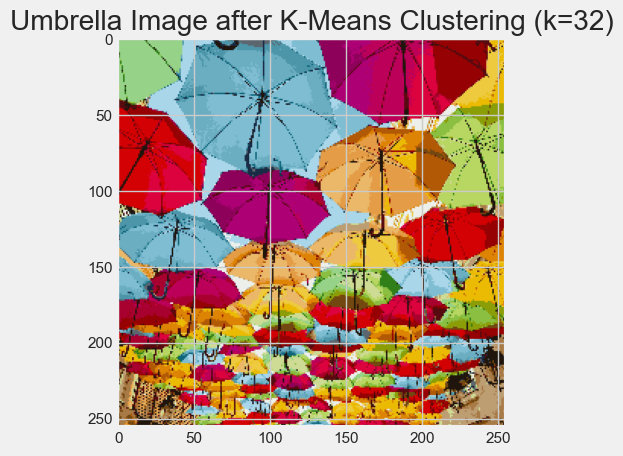

K=32 clustered image bytes:  1572864


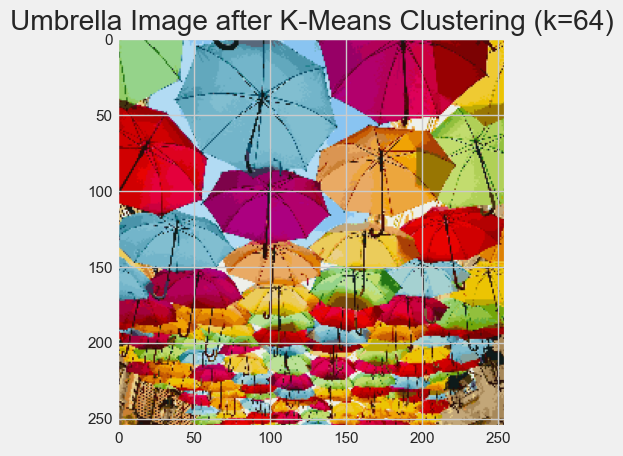

K=64 clustered image bytes:  1572864


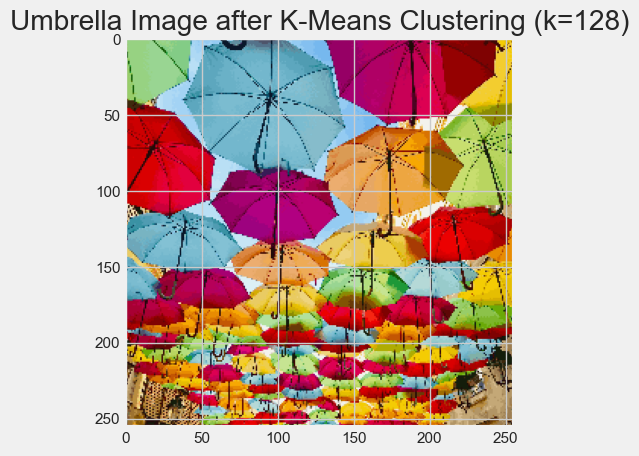

K=128 clustered image bytes:  1572864


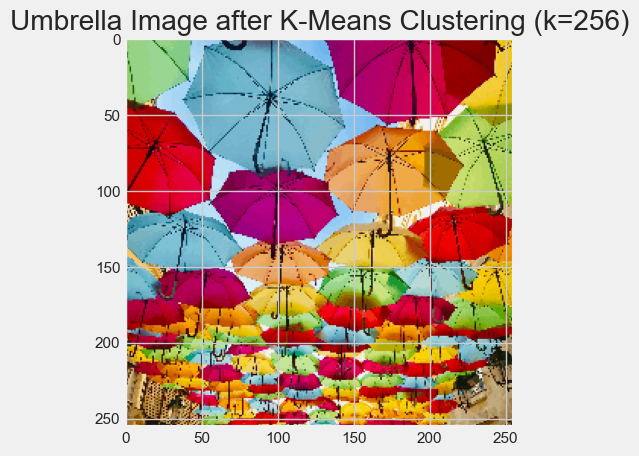

K=256 clustered image bytes:  1572864


In [311]:
#Visualize each clustered images for umbrealla.jpeg, print byte numbers
for i,image in enumerate(compressed_umbrella_images):
    plt.imshow(image.astype(np.uint8))
    plt.title(f"Umbrella Image after K-Means Clustering (k={k_values[i]})")
    plt.show()
    print(f"K={k_values[i]} clustered image bytes: ", image.nbytes)
   
  

In [312]:
um_wcss_scores

[540317556.3038285,
 245216292.01907718,
 127147959.39316027,
 65655019.62667978,
 34325942.34859257,
 18641434.382385913,
 10487178.177732116,
 6207041.654779775]

In [313]:
um_bcss_scores

[582118112.3689264,
 877160925.8632196,
 995356982.6025437,
 1056757867.4973221,
 1088064351.2150574,
 1103655556.0486054,
 1111898832.2516925,
 1116158371.7124171]

In [314]:
um_silhouette_scores

[0.46199459151320715,
 0.47973489888642257,
 0.44091537305597617,
 0.4388017717346622,
 0.41111666710088207,
 0.4032606356832413,
 0.4117387266573922,
 0.45769406999552065]

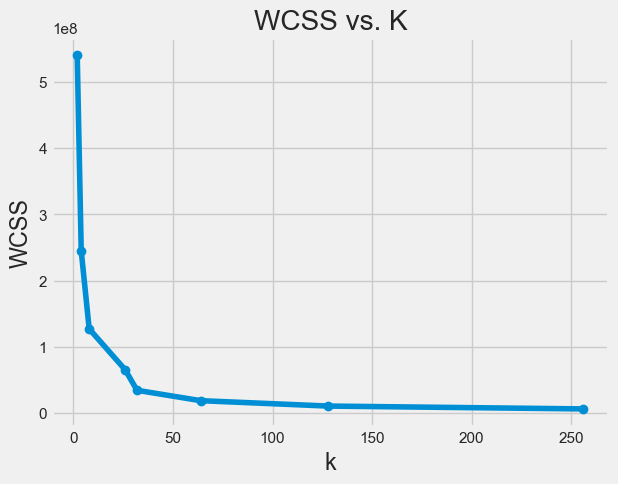

In [315]:
##plot wcss scores 
ks = np.array([2,4,8,26,32,64,128,256])
plt.style.use("fivethirtyeight")
plt.plot(ks, um_wcss_scores, marker='o')  
plt.xlabel("k")
plt.ylabel("WCSS")
plt.title("WCSS vs. K")
plt.show()

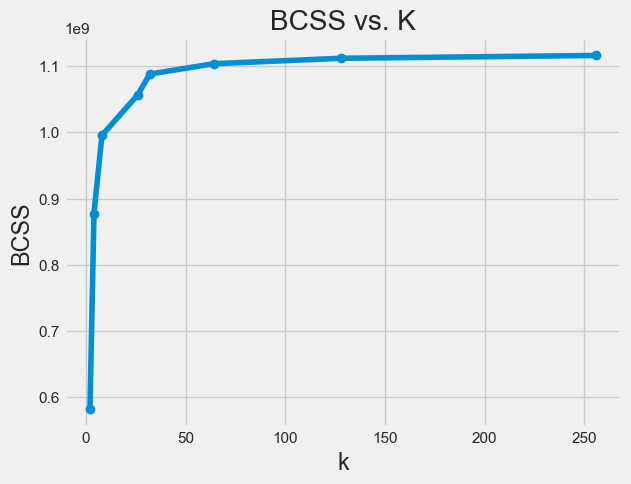

In [316]:
#plot bcss scores
plt.style.use("fivethirtyeight")
plt.plot(ks, um_bcss_scores, marker='o')  
plt.xlabel("k")
plt.ylabel("BCSS")
plt.title("BCSS vs. K")
plt.show()

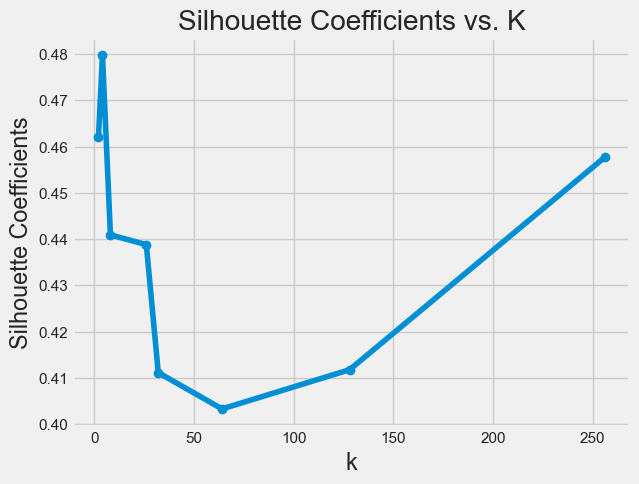

In [317]:
#silhouette coefficietns plotting
plt.style.use("fivethirtyeight")
plt.plot(ks, um_silhouette_scores, marker='o')  
plt.xlabel("k")
plt.ylabel("Silhouette Coefficients")
plt.title("Silhouette Coefficients vs. K")
plt.show()

In [318]:
#elbow locator function 
def elbow(array):
    changes = []
    change_rates = []
    for i in range(len(array)-1):
        changes.append(array[i]-array[i+1])
    for i in range(len(changes)-1):
         change_rates.append(changes[i]-changes[i+1]/changes[i])
            
    elbowindex =change_rates.index(min(change_rates))
    return 2**elbowindex

elbow(um_wcss_scores)

32

In [319]:
#For checking 
#from kneed import KneeLocator
#kl=KneeLocator(ks,um_wcss_scores, curve="convex", direction="decreasing")
#kl.elbow

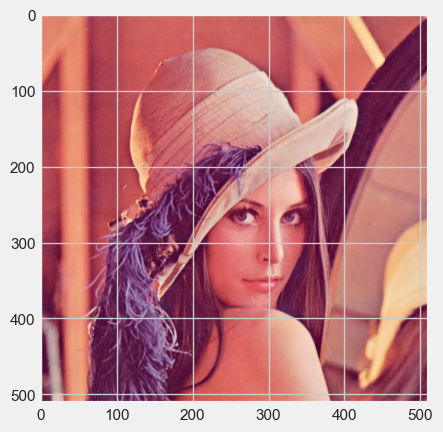

In [320]:
# Now the lenna image
original_lenna_img = plt.imread('lenna.jpeg')
plt.imshow(original_lenna_img)

In [321]:
original_lenna_img.shape 

(512, 512, 3)

In [322]:
#load lenna image & convert to bgr format to rgb format
lenna_image = cv2.imread('lenna.jpeg')
lenna_image = cv2.cvtColor(lenna_image, cv2.COLOR_BGR2RGB)

In [323]:
lenna_image.nbytes

786432

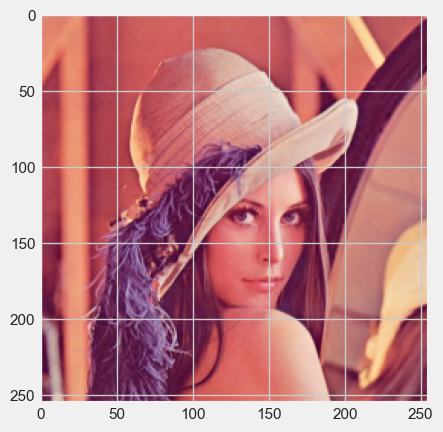

In [324]:
#Resize image to 256x256x3 
resized_lenna_image = cv2.resize(lenna_image,(256,256))
plt.imshow(resized_lenna_image)

In [325]:
resized_lenna_image.shape

(256, 256, 3)

In [326]:
#reshape to 2d array
lenna_2d = resized_lenna_image.reshape(-1, 3)
lenna_2d # [RED_channel_value, GREEN_channel_value, BLUE_channel_value]

array([[222, 138, 127],
       [224, 136, 126],
       [224, 134, 123],
       ...,
       [162,  72,  86],
       [173,  70,  81],
       [184,  72,  80]], dtype=uint8)

In [327]:
# repeat everything for umbrella image
k_values = np.array([2,4,8,16,32,64,128,256])
compressed_lenna_images = []
len_wcss_scores = []
len_bcss_scores = []
len_silhouette_scores= []
for k in k_values:
    kmeans = KMeans(n_clusters=k,init='random',n_init=10, max_iter=400, random_state=0)
    kmeans.fit(lenna_2d)
    labels = kmeans.labels_
    centers = kmeans.cluster_centers_
    compressed_img = centers[labels].reshape(resized_lenna_image.shape)
    cv2.imwrite(f'clustered_lenna_image_k{k}.jpeg',cv2.cvtColor(compressed_img.astype(np.uint8),cv2.COLOR_RGB2BGR))
    compressed_lenna_images.append(compressed_img)
    
    #find centroid colors
    print(f"Centroid colors for k={k} clusters")
    for centroid in centers:
        print("Centroid color:",find_color_name(centroid))
    
    #calculate wcss,bcss,silhouette
    len_wcss_scores.append(wcss(lenna_2d,centers,labels))
    len_bcss_scores.append(bcss(lenna_2d,centers,labels))
    len_silhouette_scores.append(silhouette(lenna_2d,centers,labels))  

Centroid colors for k=2 clusters
(130, 47, 77)
Centroid color: ('#822f4d', 'No assigned color name')
(213, 133, 124)
Centroid color: ('#d5857c', 'No assigned color name')
Centroid colors for k=4 clusters
(229, 184, 163)
Centroid color: ('#e5b8a3', 'No assigned color name')
(101, 30, 69)
Centroid color: ('#651e45', 'No assigned color name')
(171, 74, 89)
Centroid color: ('#ab4a59', 'No assigned color name')
(211, 122, 114)
Centroid color: ('#d37a72', 'No assigned color name')
Centroid colors for k=8 clusters
(171, 69, 81)
Centroid color: ('#ab4551', 'No assigned color name')
(160, 102, 131)
Centroid color: ('#a06683', 'No assigned color name')
(213, 128, 117)
Centroid color: ('#d58075', 'No assigned color name')
(224, 157, 137)
Centroid color: ('#e09d89', 'No assigned color name')
(205, 96, 96)
Centroid color: ('#cd6060', 'No assigned color name')
(94, 24, 65)
Centroid color: ('#5e1841', 'No assigned color name')
(232, 195, 172)
Centroid color: ('#e8c3ac', 'No assigned color name')
(127

Centroid colors for k=128 clusters
(204, 119, 120)
Centroid color: ('#cc7778', 'No assigned color name')
(216, 100, 91)
Centroid color: ('#d8645b', 'No assigned color name')
(139, 61, 82)
Centroid color: ('#8b3d52', 'No assigned color name')
(190, 92, 103)
Centroid color: ('#be5c67', 'No assigned color name')
(174, 86, 96)
Centroid color: ('#ae5660', 'No assigned color name')
(224, 126, 113)
Centroid color: ('#e07e71', 'No assigned color name')
(221, 182, 169)
Centroid color: ('#ddb6a9', 'No assigned color name')
(153, 49, 69)
Centroid color: ('#993145', 'No assigned color name')
(238, 214, 199)
Centroid color: ('#eed6c7', 'No assigned color name')
(199, 94, 97)
Centroid color: ('#c75e61', 'No assigned color name')
(197, 126, 143)
Centroid color: ('#c57e8f', 'No assigned color name')
(105, 28, 63)
Centroid color: ('#691c3f', 'No assigned color name')
(100, 29, 68)
Centroid color: ('#641d44', 'No assigned color name')
(202, 89, 89)
Centroid color: ('#ca5959', 'No assigned color name')
(

Centroid colors for k=256 clusters
(183, 77, 86)
Centroid color: ('#b74d56', 'No assigned color name')
(77, 13, 57)
Centroid color: ('#4d0d39', 'No assigned color name')
(206, 131, 120)
Centroid color: ('#ce8378', 'No assigned color name')
(239, 184, 129)
Centroid color: ('#efb881', 'No assigned color name')
(103, 45, 97)
Centroid color: ('#672d61', 'No assigned color name')
(216, 149, 144)
Centroid color: ('#d89590', 'No assigned color name')
(207, 95, 94)
Centroid color: ('#cf5f5e', 'No assigned color name')
(96, 26, 75)
Centroid color: ('#601a4b', 'No assigned color name')
(194, 104, 126)
Centroid color: ('#c2687e', 'No assigned color name')
(236, 185, 153)
Centroid color: ('#ecb999', 'No assigned color name')
(110, 53, 106)
Centroid color: ('#6e356a', 'No assigned color name')
(232, 152, 144)
Centroid color: ('#e89890', 'No assigned color name')
(221, 163, 155)
Centroid color: ('#dda39b', 'No assigned color name')
(166, 101, 113)
Centroid color: ('#a66571', 'No assigned color name'

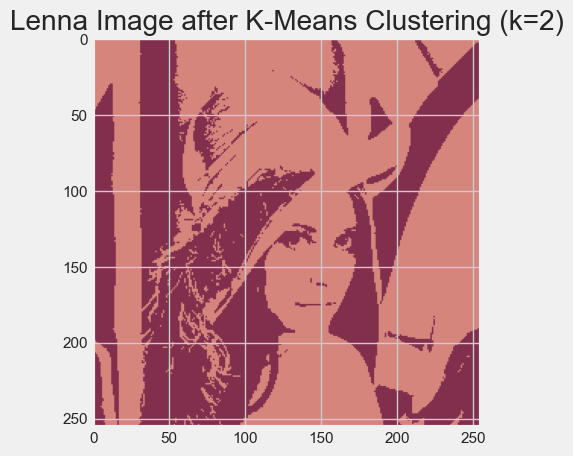

K=2 clustered image bytes:  1572864


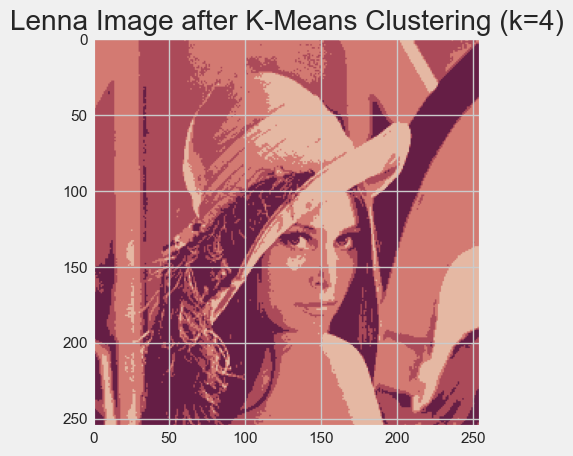

K=4 clustered image bytes:  1572864


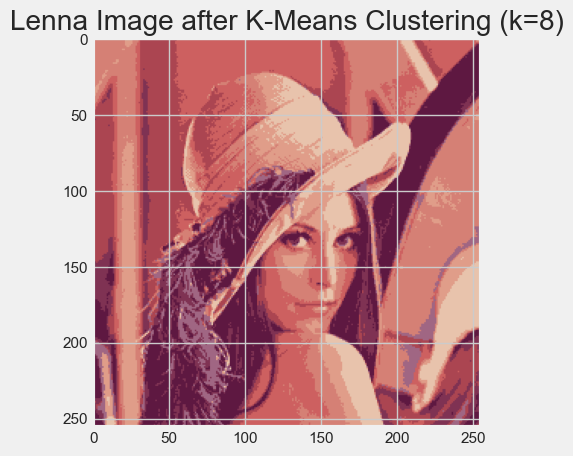

K=8 clustered image bytes:  1572864


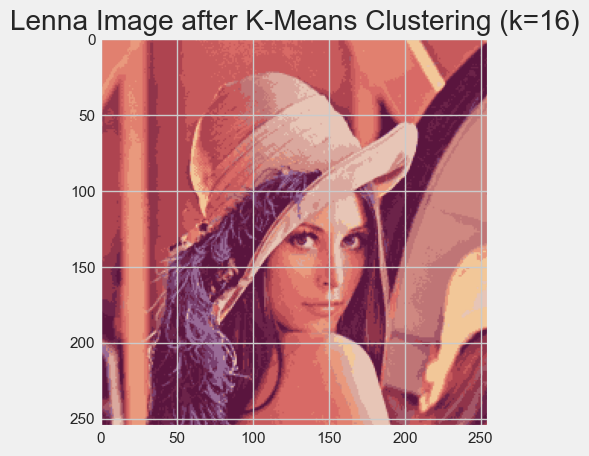

K=16 clustered image bytes:  1572864


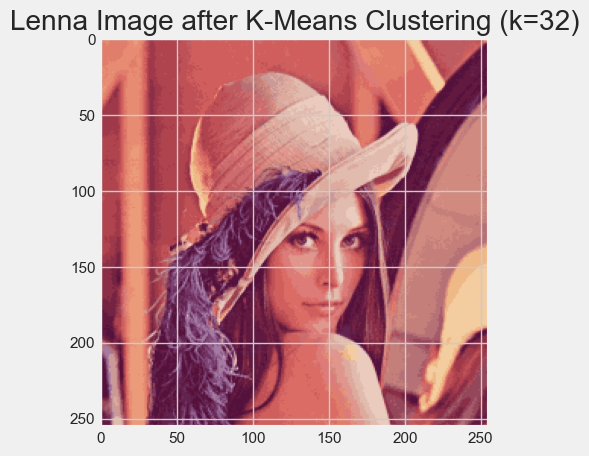

K=32 clustered image bytes:  1572864


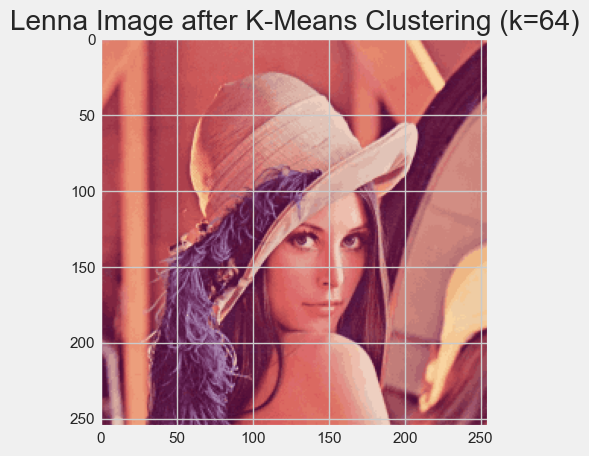

K=64 clustered image bytes:  1572864


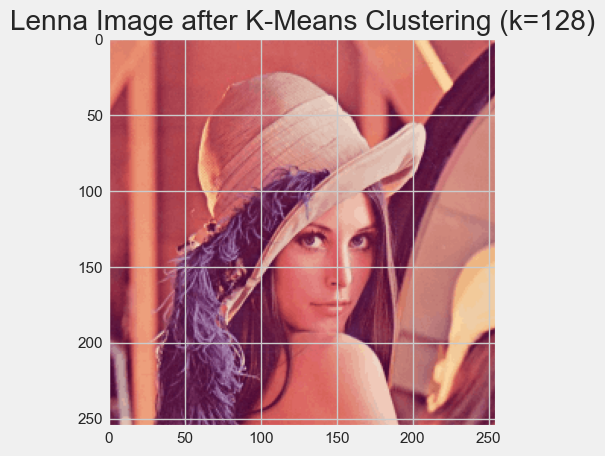

K=128 clustered image bytes:  1572864


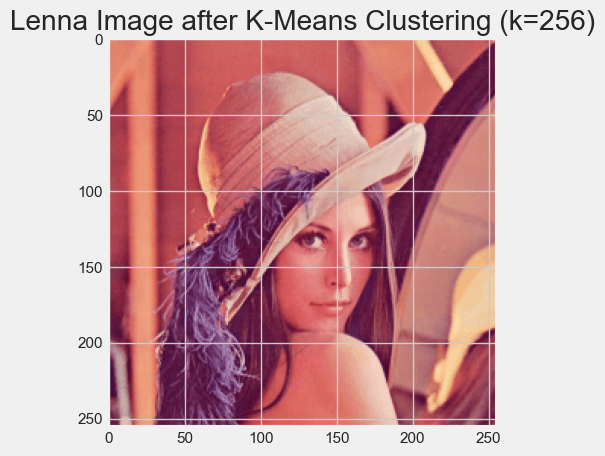

K=256 clustered image bytes:  1572864


In [328]:
#Visualize each clustered images for umbrealla.jpeg, print byte numbers
for i,image in enumerate(compressed_lenna_images):
    plt.imshow(image.astype(np.uint8))
    plt.title(f"Lenna Image after K-Means Clustering (k={k_values[i]})")
    plt.show()
    print(f"K={k_values[i]} clustered image bytes: ", image.nbytes)
   

In [329]:
len_wcss_scores

[145817778.21052894,
 50517189.99956475,
 24213459.48523209,
 12092306.018672727,
 6443085.379478194,
 3799029.223055522,
 2329825.5168051054,
 1465826.7997110076]

In [330]:
len_bcss_scores

[260849811.59907454,
 355883220.1593318,
 382629349.28971875,
 394718351.9742799,
 400107886.85570455,
 402995746.5313295,
 404375992.4528389,
 405332006.75567377]

In [331]:
len_silhouette_scores

[0.5386041340803736,
 0.4850556072200201,
 0.42030937540837365,
 0.3992700099333232,
 0.35061457013557557,
 0.3172769202672002,
 0.3350987194296207,
 0.4013857095706486]

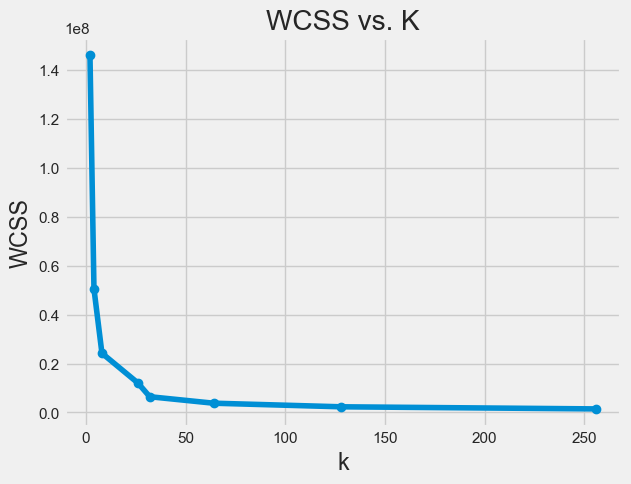

In [332]:
##plot wcss scores 
ks = np.array([2,4,8,26,32,64,128,256])
plt.style.use("fivethirtyeight")
plt.plot(ks, len_wcss_scores, marker='o')  
plt.xlabel("k")
plt.ylabel("WCSS")
plt.title("WCSS vs. K")
plt.show()

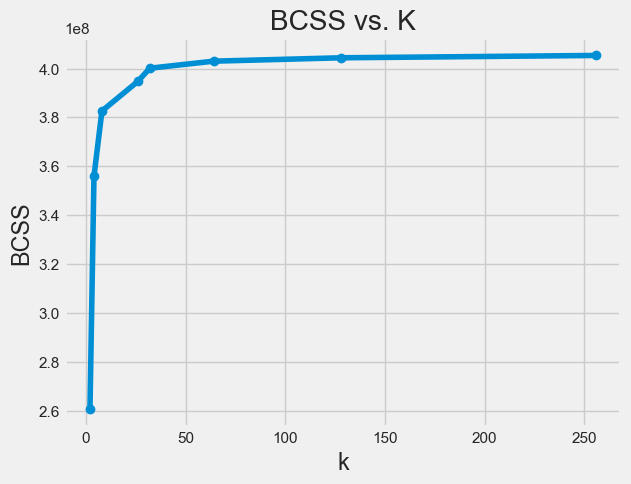

In [333]:
#plot bcss scores
plt.style.use("fivethirtyeight")
plt.plot(ks, len_bcss_scores, marker='o')  
plt.xlabel("k")
plt.ylabel("BCSS")
plt.title("BCSS vs. K")
plt.show()

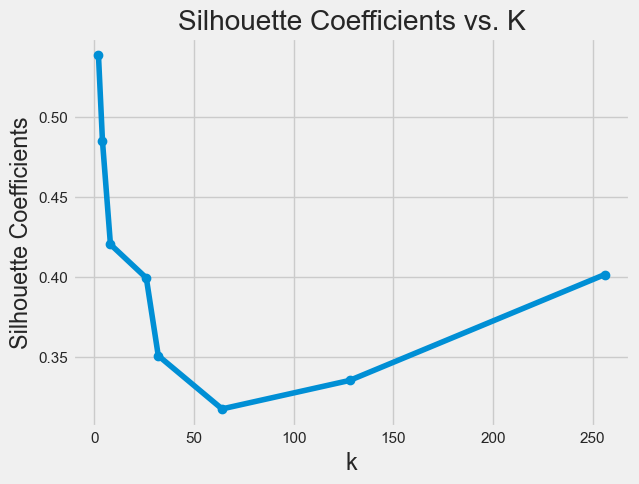

In [334]:
#silhouette coefficietns plotting
plt.style.use("fivethirtyeight")
plt.plot(ks, len_silhouette_scores, marker='o')  
plt.xlabel("k")
plt.ylabel("Silhouette Coefficients")
plt.title("Silhouette Coefficients vs. K")
plt.show()

In [335]:
def elbow(array):
    changes = []
    change_rates = []
    for i in range(len(array)-1):
        changes.append(array[i]-array[i+1])
    for i in range(len(changes)-1):
         change_rates.append(changes[i]-changes[i+1]/changes[i])
            
    elbowindex =change_rates.index(min(change_rates))
    return 2**elbowindex

elbow(len_wcss_scores)

32

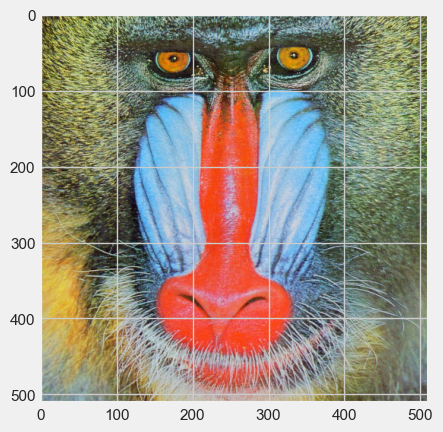

In [336]:
# Now the baboon image
original_baboon_img = plt.imread('baboon.jpeg')
plt.imshow(original_baboon_img)

In [337]:
original_baboon_img.shape 

(512, 512, 3)

In [338]:
#load baboon image & convert to bgr format to rgb format
baboon_image = cv2.imread('baboon.jpeg')
baboon_image = cv2.cvtColor(baboon_image, cv2.COLOR_BGR2RGB)

In [339]:
baboon_image.nbytes

786432

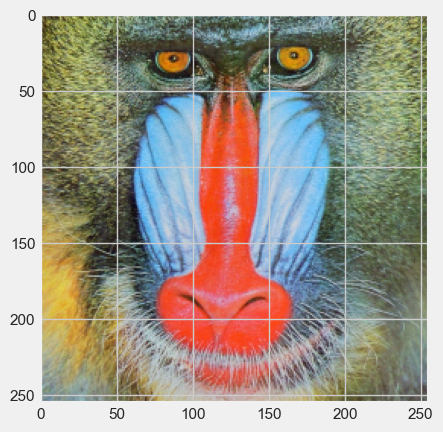

In [340]:
#Resize image to 256x256x3 
resized_baboon_image = cv2.resize(baboon_image,(256,256))
plt.imshow(resized_baboon_image)

In [341]:
resized_baboon_image.shape

(256, 256, 3)

In [342]:
#reshape to 2d array
baboon_2d = resized_baboon_image.reshape(-1, 3)
baboon_2d # [RED_channel_value, GREEN_channel_value, BLUE_channel_value]

array([[114, 110,  49],
       [ 72,  63,  20],
       [106,  95,  51],
       ...,
       [ 50,  44,  43],
       [ 45,  41,  39],
       [ 42,  38,  36]], dtype=uint8)

In [343]:
# repeat everything for umbrella image
k_values = np.array([2,4,8,16,32,64,128,256])
compressed_baboon_images = []
bab_wcss_scores = []
bab_bcss_scores = []
bab_silhouette_scores= []
for k in k_values:
    kmeans = KMeans(n_clusters=k,init='random',n_init=10, max_iter=400, random_state=0)
    kmeans.fit(baboon_2d)
    labels = kmeans.labels_
    centers = kmeans.cluster_centers_
    compressed_img = centers[labels].reshape(resized_baboon_image.shape)
    cv2.imwrite(f'clustered_baboon_image_k{k}.jpeg',cv2.cvtColor(compressed_img.astype(np.uint8),cv2.COLOR_RGB2BGR))
    compressed_baboon_images.append(compressed_img)
    
    #find centroid colors
    print(f"Centroid colors for k={k} clusters")
    for centroid in centers:
        print("Centroid color:",find_color_name(centroid))
    
    #calculate wcss,bcss,silhouette
    bab_wcss_scores.append(wcss(baboon_2d,centers,labels))
    bab_bcss_scores.append(bcss(baboon_2d,centers,labels))
    bab_silhouette_scores.append(silhouette(baboon_2d,centers,labels))

Centroid colors for k=2 clusters
(153, 171, 170)
Centroid color: ('#99abaa', 'No assigned color name')
(126, 101, 76)
Centroid color: ('#7e654c', 'No assigned color name')
Centroid colors for k=4 clusters
(150, 183, 206)
Centroid color: ('#96b7ce', 'No assigned color name')
(81, 86, 68)
Centroid color: ('#515644', 'No assigned color name')
(139, 145, 118)
Centroid color: ('#8b9176', 'No assigned color name')
(225, 100, 65)
Centroid color: ('#e16441', 'No assigned color name')
Centroid colors for k=8 clusters
(119, 140, 137)
Centroid color: ('#778c89', 'No assigned color name')
(125, 125, 87)
Centroid color: ('#7d7d57', 'No assigned color name')
(183, 158, 97)
Centroid color: ('#b79e61', 'No assigned color name')
(87, 97, 79)
Centroid color: ('#57614f', 'No assigned color name')
(174, 173, 159)
Centroid color: ('#aead9f', 'No assigned color name')
(231, 85, 60)
Centroid color: ('#e7553c', 'No assigned color name')
(60, 60, 46)
Centroid color: ('#3c3c2e', 'No assigned color name')
(140, 

Centroid colors for k=128 clusters
(181, 173, 179)
Centroid color: ('#b5adb3', 'No assigned color name')
(187, 205, 221)
Centroid color: ('#bbcddd', 'No assigned color name')
(106, 107, 63)
Centroid color: ('#6a6b3f', 'No assigned color name')
(100, 127, 134)
Centroid color: ('#647f86', 'No assigned color name')
(144, 197, 235)
Centroid color: ('#90c5eb', 'No assigned color name')
(171, 85, 77)
Centroid color: ('#ab554d', 'No assigned color name')
(140, 128, 70)
Centroid color: ('#8c8046', 'No assigned color name')
(104, 187, 238)
Centroid color: ('#68bbee', 'No assigned color name')
(116, 139, 130)
Centroid color: ('#748b82', 'No assigned color name')
(210, 74, 32)
Centroid color: ('#d24a20', 'No assigned color name')
(183, 162, 91)
Centroid color: ('#b7a25b', 'No assigned color name')
(177, 110, 28)
Centroid color: ('#b16e1c', 'No assigned color name')
(41, 40, 36)
Centroid color: ('#292824', 'No assigned color name')
(132, 191, 231)
Centroid color: ('#84bfe7', 'No assigned color nam

Centroid colors for k=256 clusters
(135, 59, 32)
Centroid color: ('#873b20', 'No assigned color name')
(214, 71, 55)
Centroid color: ('#d64737', 'No assigned color name')
(53, 50, 33)
Centroid color: ('#353221', 'No assigned color name')
(88, 93, 91)
Centroid color: ('#585d5b', 'No assigned color name')
(148, 151, 94)
Centroid color: ('#94975e', 'No assigned color name')
(121, 190, 235)
Centroid color: ('#79beeb', 'No assigned color name')
(94, 127, 160)
Centroid color: ('#5e7fa0', 'No assigned color name')
(160, 174, 174)
Centroid color: ('#a0aeae', 'No assigned color name')
(137, 158, 126)
Centroid color: ('#899e7e', 'No assigned color name')
(150, 154, 127)
Centroid color: ('#969a7f', 'No assigned color name')
(143, 191, 226)
Centroid color: ('#8fbfe2', 'No assigned color name')
(184, 173, 120)
Centroid color: ('#b8ad78', 'No assigned color name')
(166, 179, 145)
Centroid color: ('#a6b391', 'No assigned color name')
(44, 40, 31)
Centroid color: ('#2c281f', 'No assigned color name')


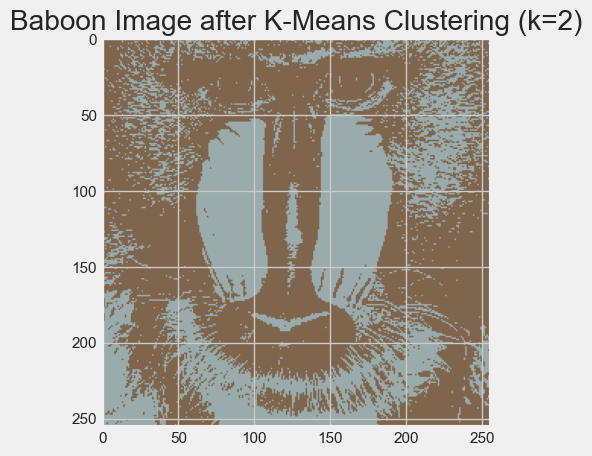

K=2 clustered image bytes:  1572864


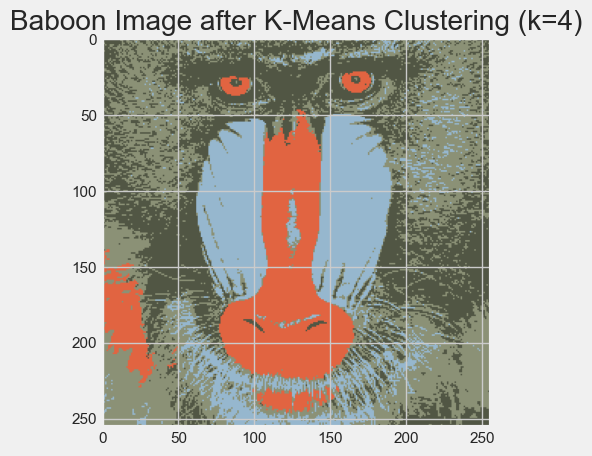

K=4 clustered image bytes:  1572864


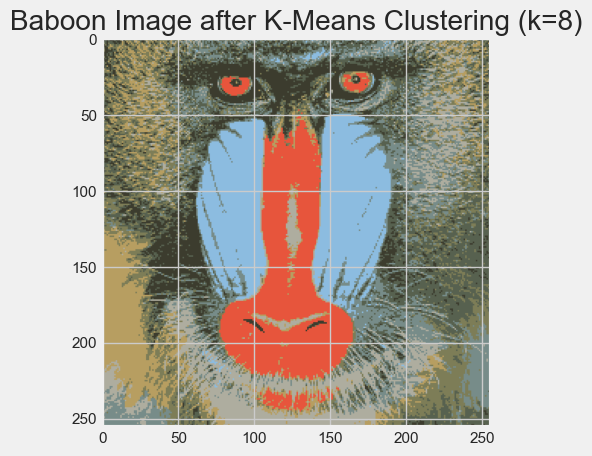

K=8 clustered image bytes:  1572864


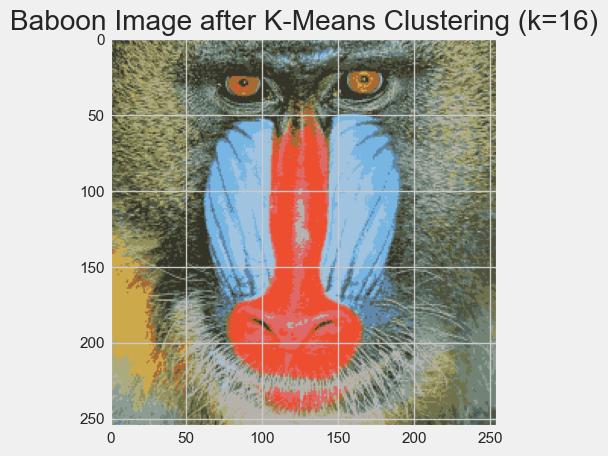

K=16 clustered image bytes:  1572864


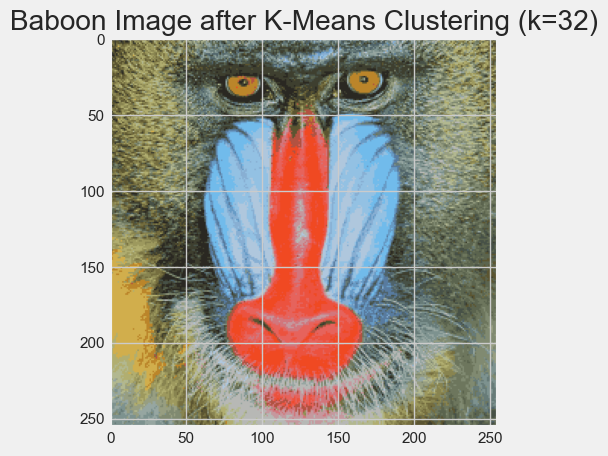

K=32 clustered image bytes:  1572864


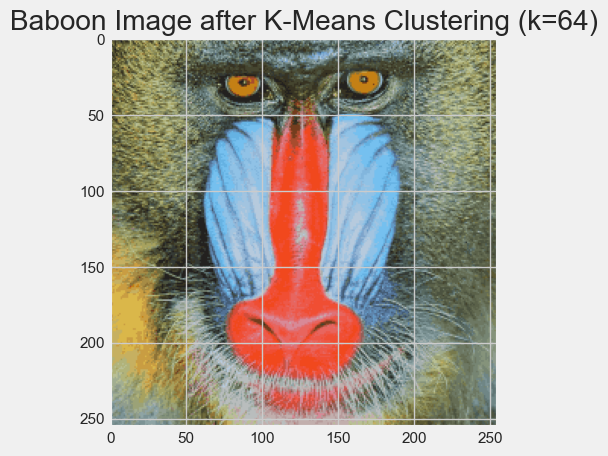

K=64 clustered image bytes:  1572864


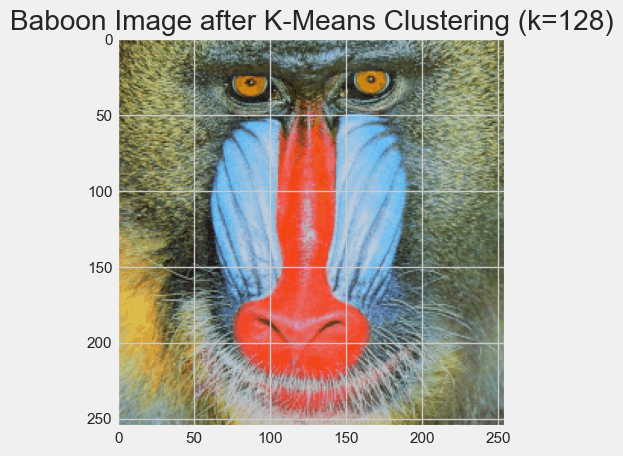

K=128 clustered image bytes:  1572864


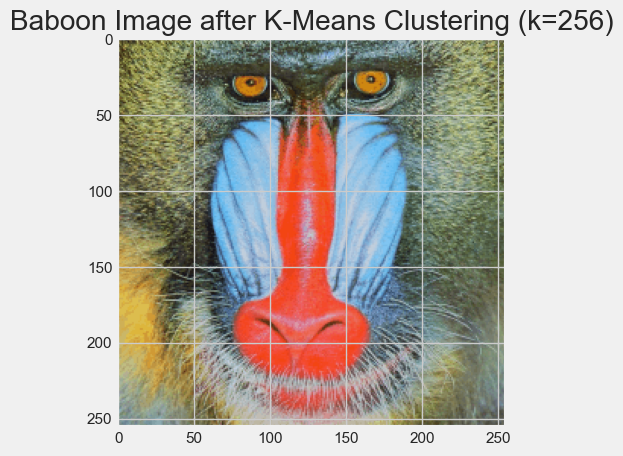

K=256 clustered image bytes:  1572864


In [344]:
#Visualize each clustered images for umbrealla.jpeg, print byte numbers
for i,image in enumerate(compressed_baboon_images):
    plt.imshow(image.astype(np.uint8))
    plt.title(f"Baboon Image after K-Means Clustering (k={k_values[i]})")
    plt.show()
    print(f"K={k_values[i]} clustered image bytes: ", image.nbytes)

In [345]:
bab_wcss_scores

[298418368.88115305,
 120079482.27502783,
 60936418.561373055,
 33023271.638128772,
 18632683.437049754,
 11069947.730852384,
 6995829.727123445,
 4428117.325235087]

In [346]:
bab_bcss_scores

[226384424.1023641,
 404353976.52025104,
 463604217.1243831,
 491501898.6631368,
 505908054.87255204,
 513446699.8851229,
 517577517.46904474,
 520105184.83773315]

In [347]:
bab_silhouette_scores

[0.394201176018812,
 0.4244755249091996,
 0.36963548546967473,
 0.3414244205452615,
 0.3209084354696032,
 0.30835072366983024,
 0.3202500846693611,
 0.3686259948448067]

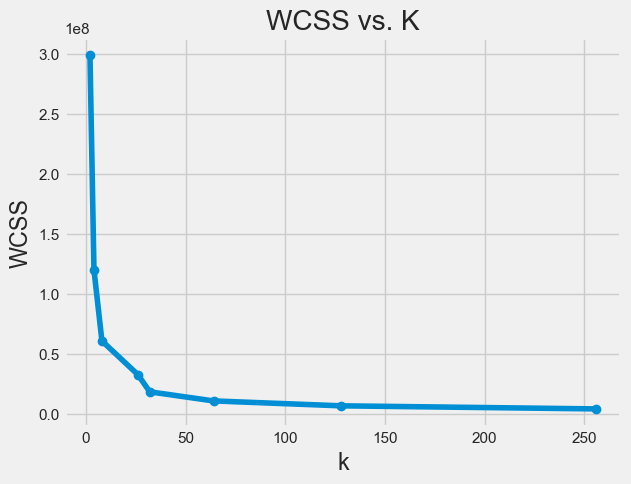

In [348]:
##plot wcss scores 
ks = np.array([2,4,8,26,32,64,128,256])
plt.style.use("fivethirtyeight")
plt.plot(ks, bab_wcss_scores, marker='o')  
plt.xlabel("k")
plt.ylabel("WCSS")
plt.title("WCSS vs. K")
plt.show()

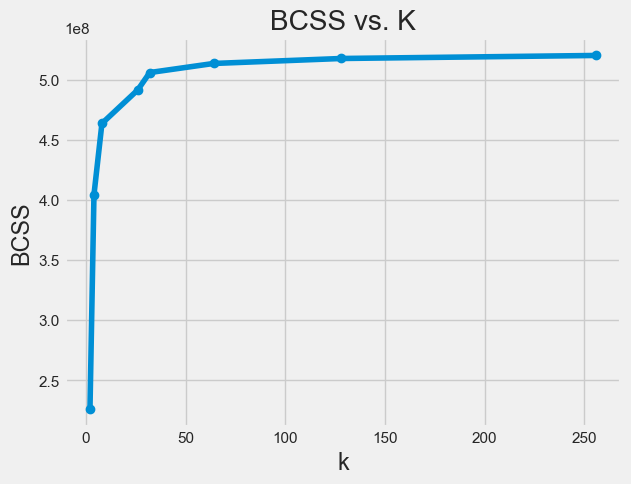

In [349]:
#plot bcss scores
plt.style.use("fivethirtyeight")
plt.plot(ks, bab_bcss_scores, marker='o')  
plt.xlabel("k")
plt.ylabel("BCSS")
plt.title("BCSS vs. K")
plt.show()

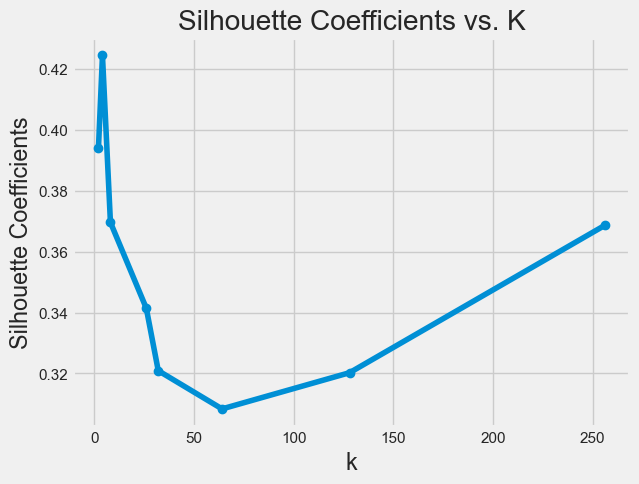

In [350]:
#silhouette coefficietns plotting
plt.style.use("fivethirtyeight")
plt.plot(ks, bab_silhouette_scores, marker='o')  
plt.xlabel("k")
plt.ylabel("Silhouette Coefficients")
plt.title("Silhouette Coefficients vs. K")
plt.show()

In [351]:
def elbow(array):
    changes = []
    change_rates = []
    for i in range(len(array)-1):
        changes.append(array[i]-array[i+1])
    for i in range(len(changes)-1):
         change_rates.append(changes[i]-changes[i+1]/changes[i])
            
    elbowindex =change_rates.index(min(change_rates))
    return 2**elbowindex

elbow(bab_wcss_scores)

32

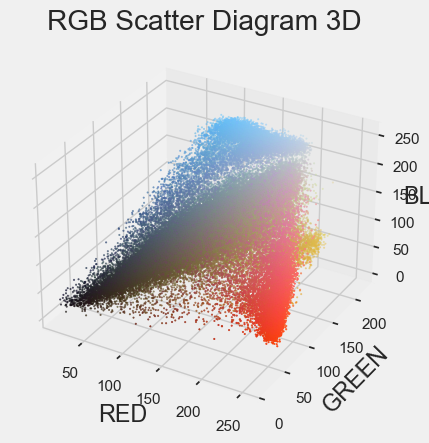

In [352]:
# Ploting scatter diagram of 3-dimensional RGB representation of image baboon to see R,G,B channels together
R = baboon_2d[:,0]
G = baboon_2d[:,1]
B = baboon_2d[:,2]

fig= plt.figure()
ax= fig.add_subplot(111, projection='3d')
ax.scatter(R,G,B, c= baboon_2d/255.0 , s=1)

ax.set_xlabel("RED")
ax.set_ylabel("GREEN")
ax.set_zlabel("BLUE")
plt.title("RGB Scatter Diagram 3D")
plt.show()

In [353]:
#finding unique colors in baboon image
rgb_tuples = list(zip(R,G,B))
unique_colors = set(rgb_tuples)
len(unique_colors)

61868

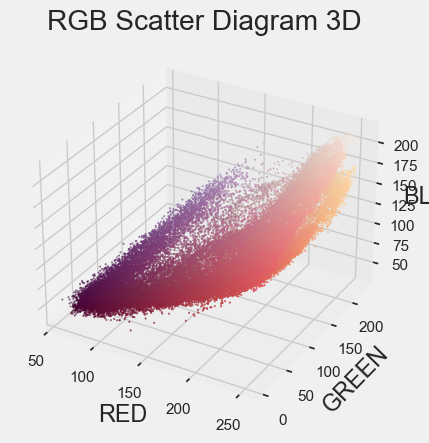

In [354]:
# Ploting scatter diagram of 3-dimensional RGB representation of image lenna to see R,G,B channels together
R = lenna_2d[:,0]
G = lenna_2d[:,1]
B = lenna_2d[:,2]

fig= plt.figure()
ax= fig.add_subplot(111, projection='3d')
ax.scatter(R,G,B, c= lenna_2d/255.0 , s=1)

ax.set_xlabel("RED")
ax.set_ylabel("GREEN")
ax.set_zlabel("BLUE")
plt.title("RGB Scatter Diagram 3D")
plt.show()

In [355]:
#finding unique colors in lenna image
rgb_tuples = list(zip(R,G,B))
unique_colors = set(rgb_tuples)
len(unique_colors)

42776

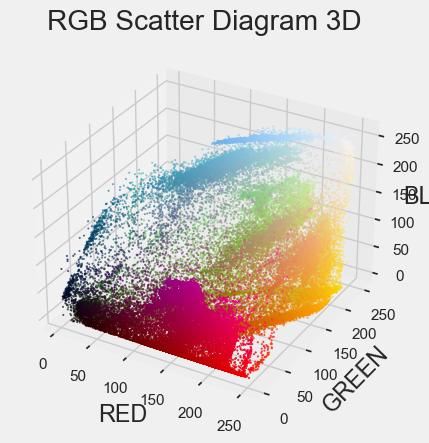

In [356]:
# Ploting scatter diagram of 3-dimensional RGB representation of image umbrella to see R,G,B channels together
R = umbrella_2d[:,0]
G = umbrella_2d[:,1]
B = umbrella_2d[:,2]

fig= plt.figure()
ax= fig.add_subplot(111, projection='3d')
ax.scatter(R,G,B, c= umbrella_2d/255.0 , s=1)

ax.set_xlabel("RED")
ax.set_ylabel("GREEN")
ax.set_zlabel("BLUE")
plt.title("RGB Scatter Diagram 3D")
plt.show()

In [357]:
#finding unique colors in umbrella image
rgb_tuples = list(zip(R,G,B))
unique_colors = set(rgb_tuples)
len(unique_colors)

45533

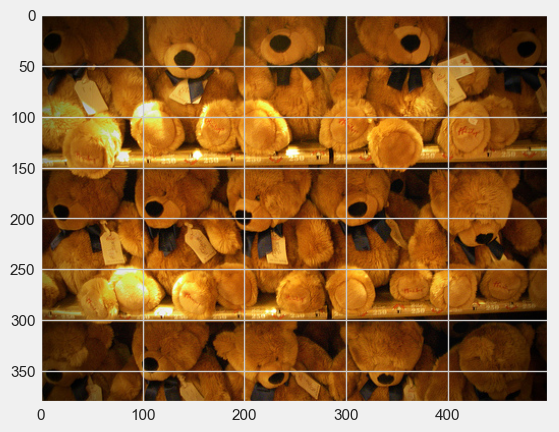

In [358]:
# Now the baboon image
original_bears_img = plt.imread('bears.jpeg')
plt.imshow(original_bears_img)

In [359]:
original_bears_img.shape 

(382, 500, 3)

In [360]:
original_bears_img.nbytes

573000

In [361]:
#load bears image & convert to bgr format to rgb format
bears_image = cv2.imread('bears.jpeg')
bears_image = cv2.cvtColor(bears_image, cv2.COLOR_BGR2RGB)

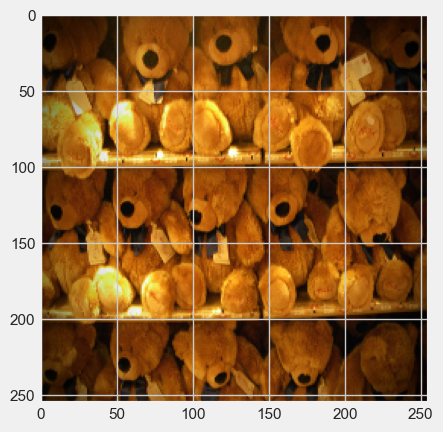

In [362]:
#Resize image to 256x256x3 
resized_bears_image = cv2.resize(bears_image,(256,256))
plt.imshow(resized_bears_image)

In [363]:
resized_bears_image.shape

(256, 256, 3)

In [364]:
#reshape to 2d array
bears_2d = resized_bears_image.reshape(-1, 3)
bears_2d # [RED_channel_value, GREEN_channel_value, BLUE_channel_value]

array([[24, 15,  5],
       [21, 13,  2],
       [21, 12,  1],
       ...,
       [17,  5,  3],
       [15,  3,  2],
       [11,  3,  0]], dtype=uint8)

In [365]:
#how many bytes dog image consist of
bears_2d.nbytes

196608

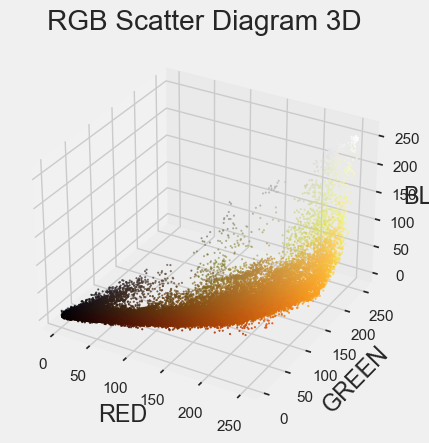

In [366]:
# Ploting scatter diagram of 3-dimensional RGB representation of image to see R,G,B channels together
R = bears_2d[:,0]
G = bears_2d[:,1]
B = bears_2d[:,2]

fig= plt.figure()
ax= fig.add_subplot(111, projection='3d')
ax.scatter(R,G,B, c= bears_2d/255.0 , s=1)

ax.set_xlabel("RED")
ax.set_ylabel("GREEN")
ax.set_zlabel("BLUE")
plt.title("RGB Scatter Diagram 3D")
plt.show()

In [367]:
#finding unique colors in bears image
rgb_tuples = list(zip(R,G,B))
unique_colors = set(rgb_tuples)
len(unique_colors)

42822

In [368]:
# repeat everything for umbrella image
k_values = np.array([2,4,8,16,32,64,128,256])
compressed_bears_images = []
bears_wcss_scores = []
bears_bcss_scores = []
bears_silhouette_scores= []
for k in k_values:
    kmeans = KMeans(n_clusters=k,init='random',n_init=10, max_iter=400, random_state=0)
    kmeans.fit(bears_2d)
    labels = kmeans.labels_
    centers = kmeans.cluster_centers_
    compressed_img = centers[labels].reshape(resized_bears_image.shape)
    cv2.imwrite(f'clustered_bears_image_k{k}.jpeg',cv2.cvtColor(compressed_img.astype(np.uint8),cv2.COLOR_RGB2BGR))
    compressed_bears_images.append(compressed_img)
    
    #find centroid colors
    print(f"Centroid colors for k={k} clusters")
    for centroid in centers:
        print("Centroid color:",find_color_name(centroid))
    
    #calculate wcss,bcss,silhouette
    bears_wcss_scores.append(wcss(bears_2d,centers,labels))
    bears_bcss_scores.append(bcss(bears_2d,centers,labels))
    bears_silhouette_scores.append(silhouette(bears_2d,centers,labels))

Centroid colors for k=2 clusters
(75, 35, 6)
Centroid color: ('#4b2306', 'No assigned color name')
(181, 108, 24)
Centroid color: ('#b56c18', 'No assigned color name')
Centroid colors for k=4 clusters
(121, 59, 7)
Centroid color: ('#793b07', 'No assigned color name')
(47, 22, 5)
Centroid color: ('#2f1605', 'No assigned color name')
(227, 175, 65)
Centroid color: ('#e3af41', 'No assigned color name')
(181, 102, 17)
Centroid color: ('#b56611', 'No assigned color name')
Centroid colors for k=8 clusters
(233, 188, 65)
Centroid color: ('#e9bc41', 'No assigned color name')
(211, 133, 30)
Centroid color: ('#d3851e', 'No assigned color name')
(178, 99, 16)
Centroid color: ('#b26310', 'No assigned color name')
(144, 73, 9)
Centroid color: ('#904909', 'No assigned color name')
(26, 13, 5)
Centroid color: ('#1a0d05', 'No assigned color name')
(229, 231, 176)
Centroid color: ('#e5e7b0', 'No assigned color name')
(68, 32, 6)
Centroid color: ('#442006', 'No assigned color name')
(108, 51, 6)
Centroi

Centroid colors for k=128 clusters
(132, 130, 58)
Centroid color: ('#84823a', 'No assigned color name')
(228, 144, 30)
Centroid color: ('#e4901e', 'No assigned color name')
(114, 51, 5)
Centroid color: ('#723305', 'No assigned color name')
(61, 47, 40)
Centroid color: ('#3d2f28', 'No assigned color name')
(132, 63, 6)
Centroid color: ('#843f06', 'No assigned color name')
(237, 155, 33)
Centroid color: ('#ed9b21', 'No assigned color name')
(18, 9, 4)
Centroid color: ('#120904', 'No assigned color name')
(75, 58, 48)
Centroid color: ('#4b3a30', 'No assigned color name')
(36, 20, 6)
Centroid color: ('#241406', 'No assigned color name')
(216, 124, 20)
Centroid color: ('#d87c14', 'No assigned color name')
(117, 65, 8)
Centroid color: ('#754108', 'No assigned color name')
(170, 89, 11)
Centroid color: ('#aa590b', 'No assigned color name')
(79, 34, 7)
Centroid color: ('#4f2207', 'No assigned color name')
(155, 72, 6)
Centroid color: ('#9b4806', 'No assigned color name')
(149, 72, 6)
Centroid 

Centroid colors for k=256 clusters
(178, 66, 11)
Centroid color: ('#b2420b', 'No assigned color name')
(62, 49, 42)
Centroid color: ('#3e312a', 'No assigned color name')
(48, 40, 36)
Centroid color: ('#302824', 'No assigned color name')
(215, 146, 43)
Centroid color: ('#d7922b', 'No assigned color name')
(207, 181, 48)
Centroid color: ('#cfb530', 'No assigned color name')
(160, 81, 12)
Centroid color: ('#a0510c', 'No assigned color name')
(48, 35, 23)
Centroid color: ('#302317', 'No assigned color name')
(38, 16, 7)
Centroid color: ('#261007', 'No assigned color name')
(239, 154, 29)
Centroid color: ('#ef9a1d', 'No assigned color name')
(4, 4, 2)
Centroid color: ('#040402', 'No assigned color name')
(213, 219, 93)
Centroid color: ('#d5db5d', 'No assigned color name')
(105, 74, 28)
Centroid color: ('#694a1c', 'No assigned color name')
(145, 77, 7)
Centroid color: ('#914d07', 'No assigned color name')
(138, 64, 9)
Centroid color: ('#8a4009', 'No assigned color name')
(116, 59, 5)
Centroi

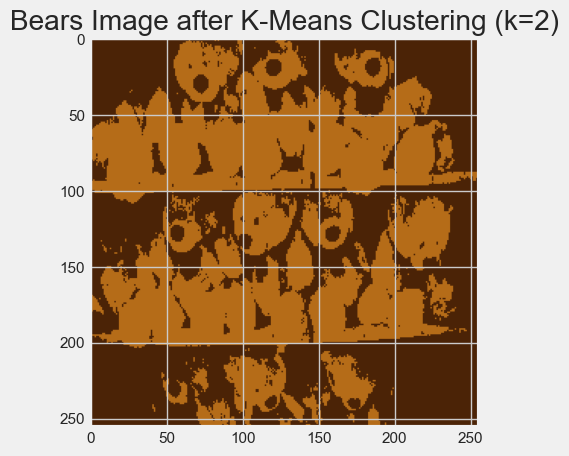

K=2 clustered image bytes:  1572864


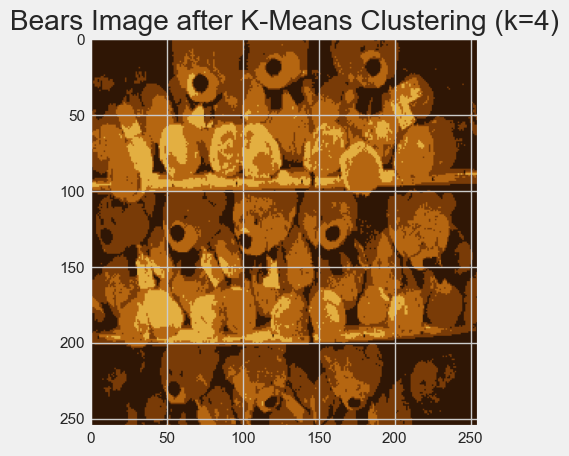

K=4 clustered image bytes:  1572864


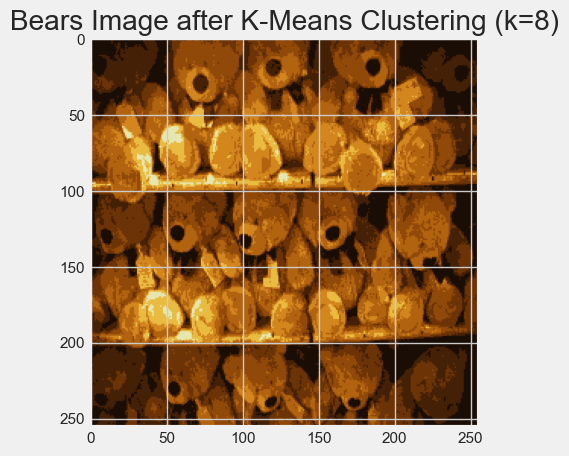

K=8 clustered image bytes:  1572864


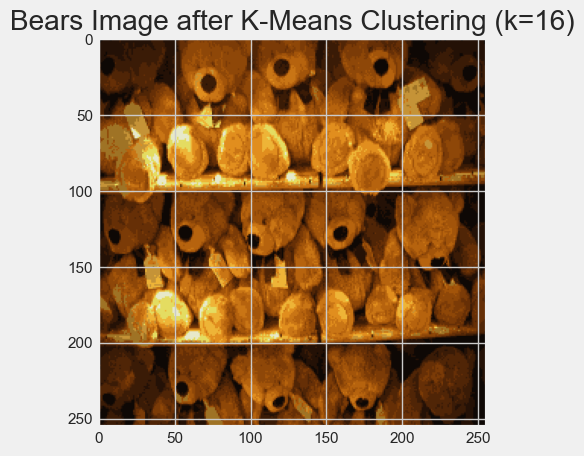

K=16 clustered image bytes:  1572864


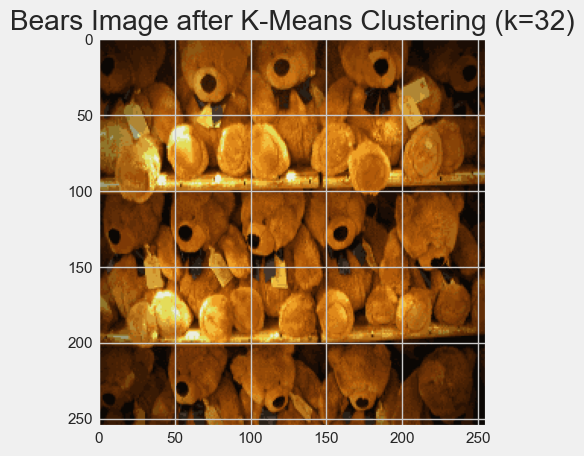

K=32 clustered image bytes:  1572864


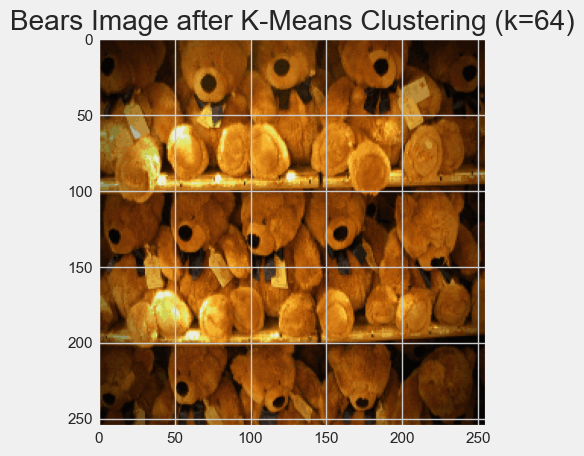

K=64 clustered image bytes:  1572864


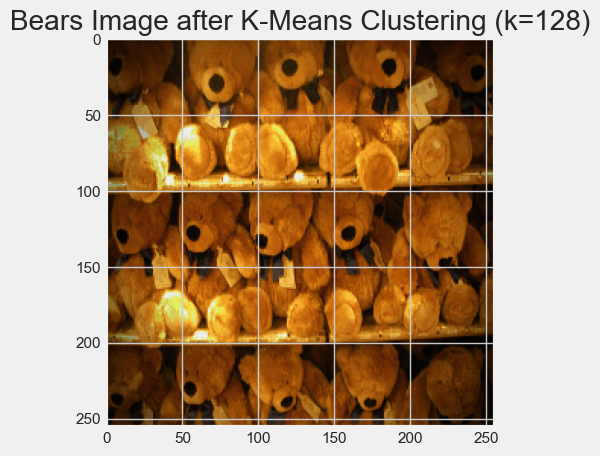

K=128 clustered image bytes:  1572864


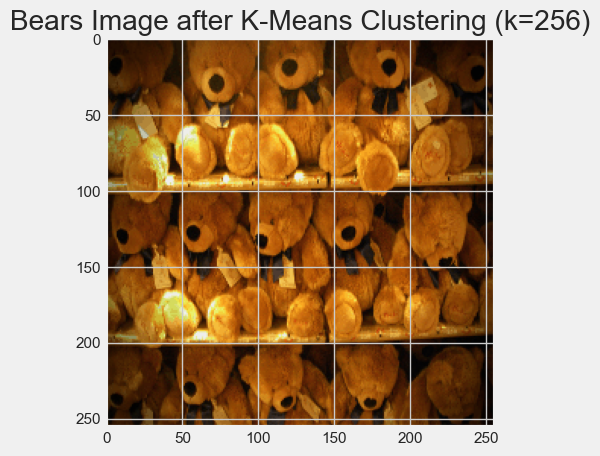

K=256 clustered image bytes:  1572864


In [369]:
#Visualize each clustered images for umbrealla.jpeg, print byte numbers
for i,image in enumerate(compressed_bears_images):
    plt.imshow(image.astype(np.uint8))
    plt.title(f"Bears Image after K-Means Clustering (k={k_values[i]})")
    plt.show()
    print(f"K={k_values[i]} clustered image bytes: ", image.nbytes)

In [370]:
bears_wcss_scores

[164895124.84979638,
 59861226.67170226,
 23274467.69548561,
 11110048.808676867,
 6187029.099928037,
 3716892.124889645,
 2438814.439024187,
 1643728.0721346783]

In [371]:
bears_bcss_scores

[276554655.8296207,
 381218570.980977,
 417457646.4715411,
 429947152.8456207,
 435009157.87395567,
 437616649.1991672,
 438919034.4178211,
 439790984.52059513]

In [372]:
bears_silhouette_scores

[0.5400201597699504,
 0.5039301337176677,
 0.4507052148954959,
 0.378167623246484,
 0.3264967272120766,
 0.31779984652657595,
 0.3197018451430996,
 0.3708569316542354]

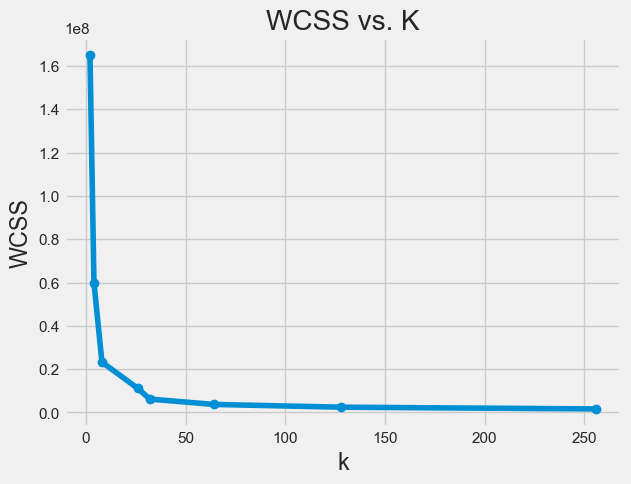

In [373]:
##plot wcss scores 
ks = np.array([2,4,8,26,32,64,128,256])
plt.style.use("fivethirtyeight")
plt.plot(ks, bears_wcss_scores, marker='o')  
plt.xlabel("k")
plt.ylabel("WCSS")
plt.title("WCSS vs. K")
plt.show()

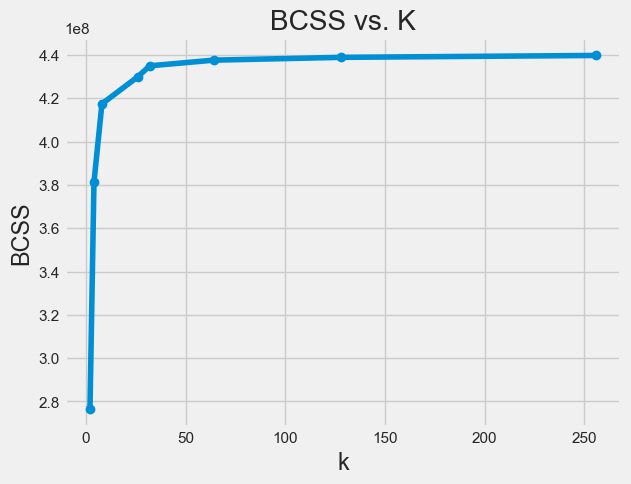

In [374]:
##plot bcss scores 
ks = np.array([2,4,8,26,32,64,128,256])
plt.style.use("fivethirtyeight")
plt.plot(ks, bears_bcss_scores, marker='o')  
plt.xlabel("k")
plt.ylabel("BCSS")
plt.title("BCSS vs. K")
plt.show()

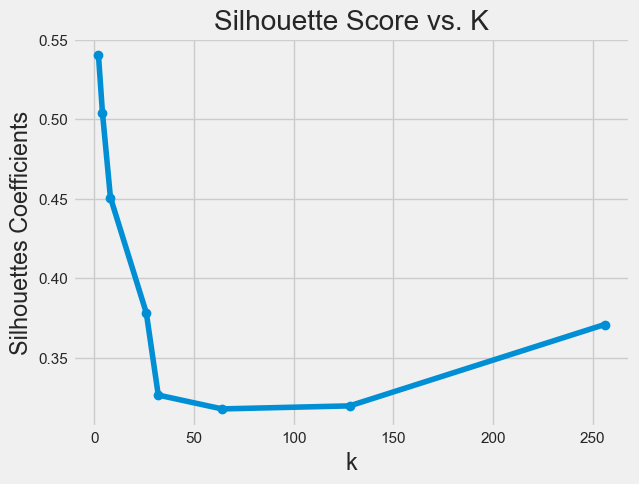

In [375]:
##plot silhouettes scores 
ks = np.array([2,4,8,26,32,64,128,256])
plt.style.use("fivethirtyeight")
plt.plot(ks, bears_silhouette_scores, marker='o')  
plt.xlabel("k")
plt.ylabel("Silhouettes Coefficients")
plt.title("Silhouette Score vs. K")
plt.show()

In [376]:
def elbow(array):
    changes = []
    change_rates = []
    for i in range(len(array)-1):
        changes.append(array[i]-array[i+1])
    for i in range(len(changes)-1):
         change_rates.append(changes[i]-changes[i+1]/changes[i])
            
    elbowindex =change_rates.index(min(change_rates))
    return 2**elbowindex

elbow(bears_wcss_scores)

32